## Map TCR and BCR to scRNA-seq data

In [1]:
import anndata as ad
import matplotlib.pyplot as plt
import muon as mu
import pandas as pd
import scanpy as sc
import scirpy as ir
import numpy as np
import os
from collections import Counter

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


In [2]:
from matplotlib.ticker import FuncFormatter, PercentFormatter
import matplotlib as mpl
import matplotlib.ticker as ticker
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["font.size"] = 12

In [3]:
figPath = '../figures/figure4'
os.makedirs(figPath, exist_ok=True)

In [4]:
adata_CD4T = sc.read_h5ad('adata-CD4T.h5ad')
adata_CD8T = sc.read_h5ad('adata-CD8T.h5ad')

In [5]:
adata_ir = sc.read_h5ad('adata-ir.h5ad')

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/rzh/BCY/lib/python3.10/site-packages/anndata/utils.py:334: ExperimentalFeatureWarning: Support for Awkward Arrays is currently experimental. Behavior may change in the future. Please report any issues you may encounter!
  warnings.warn(msg, category, stacklevel=stacklevel)


In [6]:
adata_ir.obs_names = [f"{s.split('-')[0]}-{s.split('-')[-1]}" for s in adata_ir.obs_names]

In [7]:
ir.pp.index_chains(adata_ir)
ir.tl.chain_qc(adata_ir)

In [8]:
adata_tcr = adata_ir[adata_ir.obs['receptor_type'] == 'TCR']

In [9]:
mdata_CD4T = mu.MuData({'gex': adata_CD4T, "airr":adata_tcr})
mdata_CD8T = mu.MuData({'gex': adata_CD8T, "airr":adata_tcr})

In [10]:
ir.pp.index_chains(mdata_CD8T)
ir.tl.chain_qc(mdata_CD8T)

/home/rzh/BCY/lib/python3.10/site-packages/scirpy/pp/_index_chains.py:142: ImplicitModificationWarning: Setting element `.obsm['chain_indices']` of view, initializing view as actual.
  params.adata.obsm[key_added] = ak.zip(res, depth_limit=1)  # type: ignore
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


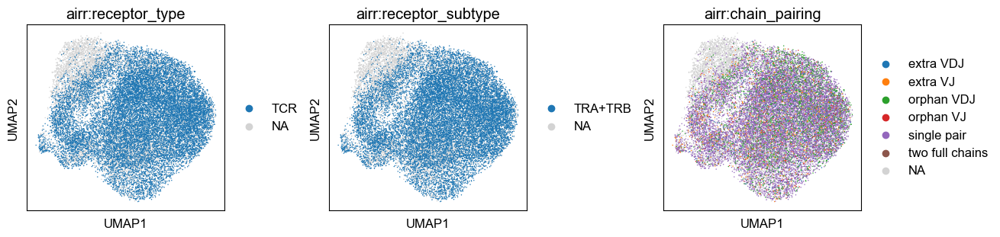

In [11]:
# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_CD8T, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/CD8T-umap-tbcr.png", dpi=300, bbox_inches='tight')


In [12]:
ir.pp.index_chains(mdata_CD4T)
ir.tl.chain_qc(mdata_CD4T)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


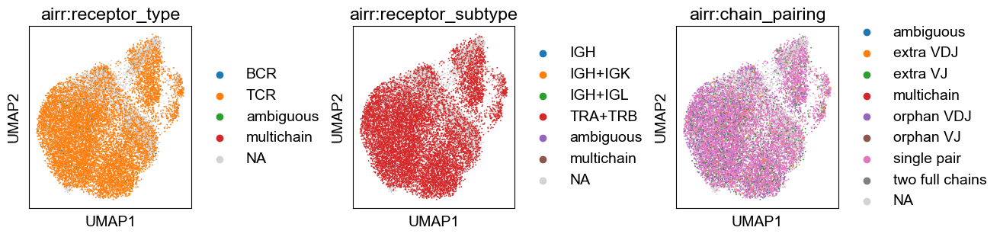

In [ ]:
# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_CD4T, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/CD4T-umap-tbcr.png", dpi=300, bbox_inches='tight')

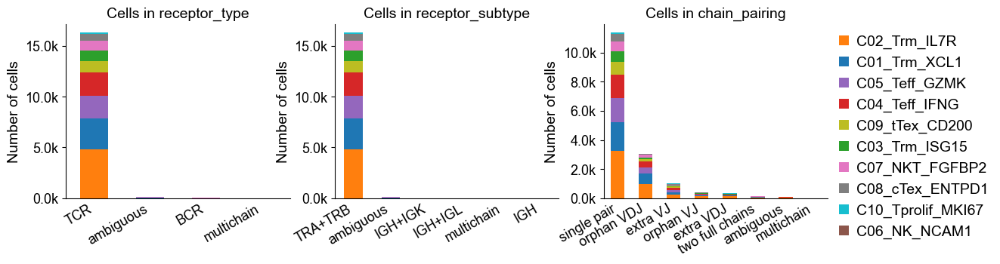

In [25]:
# abundance of TCR,BCR targeting molecular_type
def ks(x, pos):
    return '%1.1fk' % (x*1e-3)
fig, ax = plt.subplots(1, 3,figsize=(13,3))
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  ir.pl.group_abundance(mdata_CD8T, groupby=g, 
                        target_col="gex:anno-CD8T", 
                        ax=ax[i], 
                        style_kws={"title": "Cells in {}".format(g.split(":")[1]),
                                   "xlab": '',
                                   "title_fontsize":14, 
                                   "label_fontsize":14, 
                                   "tick_fontsize":13,
                                   "add_legend": True})
  ax[i].yaxis.set_major_formatter(FuncFormatter(ks))
  ax[i].legend().set_visible(False)
ax[2].legend(fontsize=14,
      frameon=False, handletextpad=0.5,bbox_to_anchor=(1, -0.3),
      loc='lower left',
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
fig.savefig(f"{figPath}/CD8-abundance-tbcr-major.png", dpi=300, bbox_inches='tight')

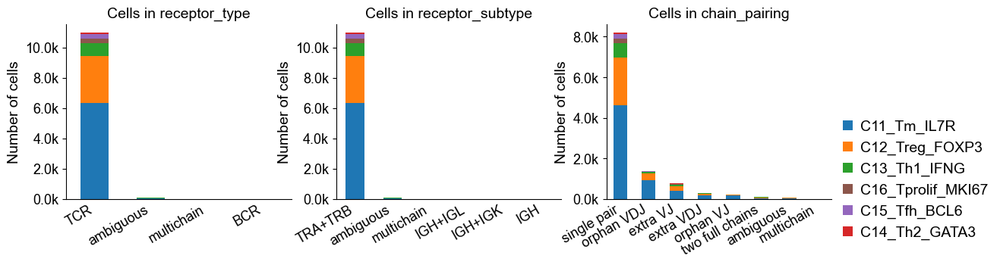

In [92]:
# abundance of TCR,BCR targeting molecular_type
def ks(x, pos):
    return '%1.1fk' % (x*1e-3)
fig, ax = plt.subplots(1, 3,figsize=(13,3))
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  ir.pl.group_abundance(mdata_CD4T, groupby=g, 
                        target_col="gex:anno-CD4T", 
                        ax=ax[i], 
                        style_kws={"title": "Cells in {}".format(g.split(":")[1]),
                                   "xlab": '',
                                   "title_fontsize":14, 
                                   "label_fontsize":14, 
                                   "tick_fontsize":13,
                                   "add_legend": True})
  ax[i].yaxis.set_major_formatter(FuncFormatter(ks))
  ax[i].legend().set_visible(False)
ax[2].legend(fontsize=14,
      frameon=False, handletextpad=0.5,bbox_to_anchor=(1, -0.3),
      loc='lower left',
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
fig.savefig(f"{figPath}/CD4-abundance-tbcr-major.png", dpi=300, bbox_inches='tight')

  0%|          | 0/20624 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


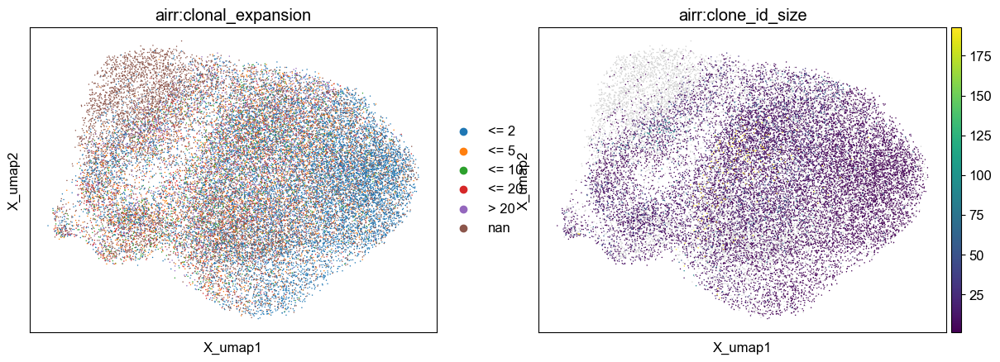

In [13]:
ir.pp.ir_dist(mdata_CD8T, metric="identity", sequence="nt", key_added="ir_dist_nt_identity", n_jobs=16)
ir.tl.define_clonotypes(mdata_CD8T, key_added="clone_id", same_v_gene=False, dual_ir='primary_only',receptor_arms="all" )
ir.tl.clonal_expansion(mdata_CD8T, target_col="clone_id", key_added="clonal_expansion", breakpoints=[2,5,10,20])
mu.pl.embedding(mdata_CD8T, basis='gex:umap',color=['airr:clonal_expansion', 'airr:clone_id_size'])

In [401]:
mdata_CD8T.obs['airr:clone_expanded'] = mdata_CD8T.obs['airr:clone_id_size'] > 1
id_size = mdata_CD8T.obs.loc[~mdata_CD8T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD8T','airr:clone_id_size']].groupby('gex:anno-CD8T').sum()
cell_size = mdata_CD8T.obs.loc[~mdata_CD8T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD8T','airr:clone_id_size']].groupby('gex:anno-CD8T').count()
id_size_CD8 = pd.concat([id_size, cell_size], axis=1)
id_size_CD8['clone_size_per_cell'] = id_size_CD8.apply(lambda x:x[0]/x[1], axis=1)
id_size_CD8['majorType'] = 'CD8'
id_size_CD8.loc[id_size_CD8.index.isin(['C06_NK_NCAM1']), 'majorType'] = 'NK'
id_size_CD8.loc[id_size_CD8.index.isin(['C07_NKT_FGFBP2']), 'majorType'] = 'NKT'
id_size_CD8

,airr:clone_id_size,airr:clone_id_size,clone_size_per_cell,majorType
gex:anno-CD8T,,,,
C01_Trm_XCL1,28937.0,2984,9.697386,CD8
C02_Trm_IL7R,19113.0,4833,3.954687,CD8
C03_Trm_ISG15,7091.0,1058,6.702268,CD8
C04_Teff_IFNG,40276.0,2265,17.781898,CD8
C05_Teff_GZMK,26373.0,2294,11.496513,CD8
C06_NK_NCAM1,205.0,46,4.456522,NK
C07_NKT_FGFBP2,14092.0,950,14.833684,NKT
C08_cTex_ENTPD1,7002.0,653,10.722818,CD8
C09_tTex_CD200,10668.0,1098,9.715847,CD8


In [402]:
cloned_cellprops = mdata_CD8T.obs.loc[~mdata_CD8T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD8T', 'airr:clone_expanded']]
cloned_cellprops = cloned_cellprops[cloned_cellprops['airr:clone_expanded'] == True].groupby('gex:anno-CD8T').count()
# cloned_cellprops = cloned_cellprops / cloned_cellprops.sum()
cell_size = pd.DataFrame(mdata_CD8T.obs.loc[~mdata_CD8T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD8T']].value_counts(), columns=['cell_size']).sort_index()
cell_size.index = cloned_cellprops.index
cloned_cellprops = pd.concat([cloned_cellprops, cell_size], axis=1)
cloned_cellprops['clone_expanded_ratio'] = cloned_cellprops.apply(lambda x:x[0]/x[1], axis=1)
cloned_cellprops

,airr:clone_expanded,cell_size,clone_expanded_ratio
gex:anno-CD8T,,,
C01_Trm_XCL1,1672,3777,0.442679
C02_Trm_IL7R,1478,5853,0.252520
C03_Trm_ISG15,475,1271,0.373721
C04_Teff_IFNG,1521,2699,0.563542
C05_Teff_GZMK,1260,2822,0.446492
C06_NK_NCAM1,16,850,0.018824
C07_NKT_FGFBP2,606,1861,0.325631
C08_cTex_ENTPD1,423,855,0.494737
C09_tTex_CD200,824,1222,0.674304


In [403]:
cluProfile_CD8T = pd.concat([id_size_CD8, cloned_cellprops], axis=1)
adata_CD8T.uns['clusterProfile_CD8T'] = cluProfile_CD8T

  0%|          | 0/20624 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


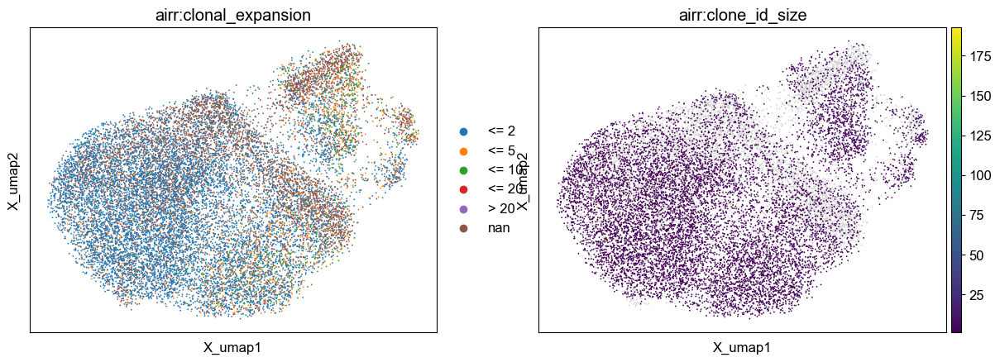

In [30]:
ir.pp.ir_dist(mdata_CD4T, metric="identity", sequence="nt", key_added="ir_dist_nt_identity", n_jobs=16)
ir.tl.define_clonotypes(mdata_CD4T, key_added="clone_id", same_v_gene=False, dual_ir='primary_only',receptor_arms="all" )
ir.tl.clonal_expansion(mdata_CD4T, target_col="clone_id", key_added="clonal_expansion", breakpoints=[2,5,10,20])
mu.pl.embedding(mdata_CD4T, basis='gex:umap',color=['airr:clonal_expansion', 'airr:clone_id_size'])

In [54]:
id_CD8 = ir.tl.summarize_clonal_expansion(mdata_CD8T, groupby='gex:anno-newCD8T', normalize=True)
id_CD8['majorType'] = 'CD8'
id_CD8.loc[id_CD8.index.isin(['C09_NK_NCAM1']), 'majorType'] = 'NK'
id_CD8.loc[id_CD8.index.isin(['C10_NKT_FGFBP2']), 'majorType'] = 'NKT'

In [22]:
id_CD4 = ir.tl.summarize_clonal_expansion(mdata_CD4T, groupby='gex:anno-CD4T', normalize=True)
id_CD4['majorType'] = 'CD4'

In [404]:
mdata_CD4T.obs['airr:clone_expanded'] = mdata_CD4T.obs['airr:clone_id_size'] > 1
id_size = mdata_CD4T.obs.loc[~mdata_CD4T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD4T','airr:clone_id_size']].groupby('gex:anno-CD4T').sum()
cell_size = mdata_CD4T.obs.loc[~mdata_CD4T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD4T','airr:clone_id_size']].groupby('gex:anno-CD4T').count()
id_size_CD4 = pd.concat([id_size, cell_size], axis=1)
id_size_CD4['clone_size_per_cell'] = id_size_CD4.apply(lambda x:x[0]/x[1], axis=1)
id_size_CD4['majorType'] = 'CD4'
id_size_CD4

,airr:clone_id_size,airr:clone_id_size,clone_size_per_cell,majorType
gex:anno-CD4T,,,,
C11_Tm_IL7R,10552.0,6338,1.664879,CD4
C12_Treg_FOXP3,8229.0,3101,2.653660,CD4
C13_Th1_IFNG,4404.0,854,5.156909,CD4
C14_Th2_GATA3,721.0,122,5.909836,CD4
C15_Tfh_BCL6,672.0,266,2.526316,CD4
C16_Tprolif_MKI67,1540.0,308,5.000000,CD4


In [405]:
mdata_CD4T.obs['airr:clone_expanded'] = mdata_CD4T.obs['airr:clone_id_size'] > 1
cloned_cellprops = mdata_CD4T.obs.loc[~mdata_CD4T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD4T', 'airr:clone_expanded']]
cloned_cellprops = cloned_cellprops[cloned_cellprops['airr:clone_expanded'] == True].groupby('gex:anno-CD4T').count()
# cloned_cellprops = cloned_cellprops / cloned_cellprops.sum()
cell_size = pd.DataFrame(mdata_CD4T.obs.loc[~mdata_CD4T.obs['gex:batch'].isin(['1T', '2T', '3T']), ['gex:anno-CD4T']].value_counts(), columns=['cell_size']).sort_index()
cell_size.index = cloned_cellprops.index
cloned_cellprops = pd.concat([cloned_cellprops, cell_size], axis=1)
cloned_cellprops['clone_expanded_ratio'] = cloned_cellprops.apply(lambda x:x[0]/x[1], axis=1)
cloned_cellprops

,airr:clone_expanded,cell_size,clone_expanded_ratio
gex:anno-CD4T,,,
C11_Tm_IL7R,825,7642,0.107956
C12_Treg_FOXP3,1505,3292,0.457169
C13_Th1_IFNG,664,896,0.741071
C14_Th2_GATA3,82,132,0.621212
C15_Tfh_BCL6,106,287,0.369338
C16_Tprolif_MKI67,199,334,0.595808


In [53]:
mdata_CD8T.obs['gex:anno-newCD8T'] = adata_CD8T.obs['anno-newCD8T']

In [406]:
cluProfile_CD4T = pd.concat([id_size_CD4, cloned_cellprops], axis=1)
adata_CD4T.uns['clusterProfile_CD4T'] = cluProfile_CD4T

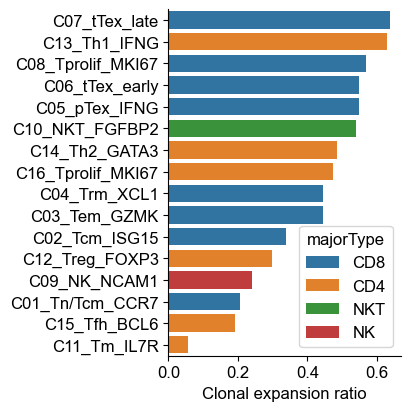

In [55]:
id_size = pd.concat([id_CD8, id_CD4], axis=0)
id_size['name'] = id_size.index
id_size = id_size.sort_values(by='> 2', ascending=False)
import seaborn as sns
fig, ax = plt.subplots(figsize=(3, 4.5))
sns.barplot(data=id_size, y='name', x='> 2', hue='majorType', orient='h', ax=ax)
ax.set_xlabel("Clonal expansion ratio")
ax.set_ylabel("")
ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
fig.savefig(f"{figPath}/4f-clonal_expansion_props.svg", bbox_inches='tight')

In [25]:
def propPlot(age_df, barlabels, ax, colors=sc.pl.palettes.default_20, xlabel='Patient ID', show_label=True, bar_label='total'):
    all_df = age_df.sum(axis=1)
    age_normdf = pd.DataFrame([age_df.loc[i,:] for i in barlabels], index=barlabels)
    age_norm1df = pd.DataFrame([age_df.loc[i,:]/all_df[i] for i in barlabels], index=barlabels)
    age_cumdf = pd.DataFrame([np.cumsum(age_norm1df.loc[i,:]) for i in barlabels], index=barlabels)
    norm_gdfs = age_norm1df
    cum_gdfs = age_cumdf
    for i, col in enumerate(age_df.columns):
        height = norm_gdfs[col]
        starts = cum_gdfs[col] - height
        rects = ax.barh(barlabels, height, left=starts, height=0.9, color=colors[i], edgecolor='white', linewidth=0.5,
                        label=col, alpha=1)
    if bar_label == 'total':
        counts = [int(val) for val in all_df]
    else:
        counts = [int(val) for val in age_normdf.loc[:, age_norm1df.columns[0]]]
    if show_label:
        ax.bar_label(rects, counts, 
                    label_type='edge', color='#7f3730', fontsize=10)
        # ax.bar_label(rects,age_df.loc[:, col], label_type='center', color='lightgrey', fontsize=14)
    ax.legend( bbox_to_anchor=(1, 0.3), 
              handletextpad=0.5, frameon=False,
                          borderpad=0.4,
                          columnspacing=1,
                          handlelength=0.65,
              loc='lower left')
    ax.set_ylabel(xlabel)
    # def ks(x, pos):
    #     return '%1.1fk' % (x*1e-3)
    # ax.xaxis.set_major_formatter(FuncFormatter(ks))
    # ax.set_yticks(barlabels)
    # ax.set_xticklabels(labels=barlabels,rotation=xrotate)
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)

In [26]:
def countPlot(age_df, barlabels, ax, colors=sc.pl.palettes.default_20, xlabel='Patient ID', show_label=True, bar_label='total'):
    all_df = age_df.sum(axis=1)
    age_normdf = pd.DataFrame([age_df.loc[i,:] for i in barlabels], index=barlabels)
    age_cumdf = pd.DataFrame([np.cumsum(age_normdf.loc[i,:]) for i in barlabels], index=barlabels)
    norm_gdfs = age_normdf
    cum_gdfs = age_cumdf
    for i, col in enumerate(age_df.columns):
        height = norm_gdfs[col]
        starts = cum_gdfs[col] - height
        rects = ax.barh(barlabels, height, left=starts, height=0.9, color=colors[i], edgecolor='white', linewidth=0.5,
                        label=col, alpha=1)
    if bar_label == 'total':
        counts = [int(val) for val in all_df]
    elif bar_label == 'topRate':
        counts = (age_df.iloc[:, 0] / (age_df.iloc[:, 0] + age_df.iloc[:, 1])).fillna(0)
        counts = [round(val, 2) for val in counts]
    else:
        counts = [int(val) for val in age_normdf.loc[:, age_normdf.columns[0]]]
    if show_label:
        ax.bar_label(rects, counts, 
                    label_type='edge', color='#7f3730', fontsize=10)
        # ax.bar_label(rects,age_df.loc[:, col], label_type='center', color='lightgrey', fontsize=14)
    ax.legend( bbox_to_anchor=(1, 0.3), 
              handletextpad=0.5, frameon=False,
                          borderpad=0.4,
                          columnspacing=1,
                          handlelength=0.65,
              loc='lower left')
    ax.set_ylabel(xlabel)
    # def ks(x, pos):
    #     return '%1.1fk' % (x*1e-3)
    # ax.xaxis.set_major_formatter(FuncFormatter(ks))
    # ax.set_yticks(barlabels)
    # ax.set_xticklabels(labels=barlabels,rotation=xrotate)
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)

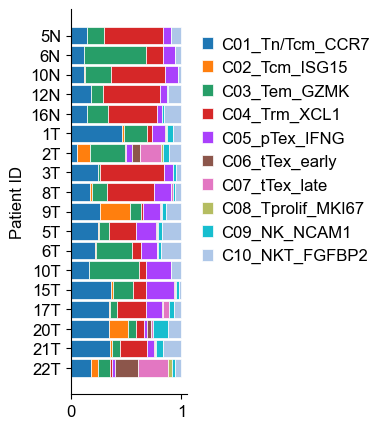

In [56]:
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','17T','20T', '21T', '22T']
barlabels.reverse()
cell_types = list(adata_CD8T.obs['anno-newCD8T'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_CD8T[(adata_CD8T.obs["anno-newCD8T"] == ct) & (adata_CD8T.obs["batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
fig0, ax0 = plt.subplots(figsize=(1.5, 5))
propPlot(age_df, ax=ax0, barlabels=barlabels, show_label=False)
fig0.savefig(f"{figPath}/4d-CD8T_batch_proportions.svg",bbox_inches='tight')

In [509]:
mdata_CD8T.obs['airr:cells_with_TCRs'] = mdata_CD8T.obs['airr:clone_id_size'] > 0
mdata_CD4T.obs['airr:cells_with_TCRs'] = mdata_CD4T.obs['airr:clone_id_size'] > 0
CD8_tcr = mdata_CD8T.obs[['gex:batch','airr:cells_with_TCRs']]
CD8_tcr['majorType'] = 'CD8'
CD4_tcr = mdata_CD4T.obs[['gex:batch','airr:cells_with_TCRs']]
CD4_tcr['majorType'] = 'CD4'
tcr = pd.concat([CD8_tcr, CD4_tcr], axis=0)
tcr['cells_with_TCRs'] = ['with' if x == True else 'without' for x in tcr['airr:cells_with_TCRs']]
tcr = tcr.dropna()
tcr

/tmp/ipykernel_1912653/3277888605.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CD8_tcr['majorType'] = 'CD8'
/tmp/ipykernel_1912653/3277888605.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CD4_tcr['majorType'] = 'CD4'


,gex:batch,airr:cells_with_TCRs,majorType,cells_with_TCRs
AAACCCAGTGGTAATA-1T,1T,False,CD8,without
AAACGAAGTGCGAGTA-1T,1T,False,CD8,without
AAACGAATCCGCTAGG-1T,1T,False,CD8,without
AAAGAACAGCCGTTGC-1T,1T,False,CD8,without
AAAGAACCAAACTGCT-1T,1T,False,CD8,without
...,...,...,...,...
TTGACTTGTATTCTCT-22T,22T,True,CD4,with
TTGCCGTAGTTAGCGG-22T,22T,True,CD4,with
TTGTAGGTCCCGGATG-22T,22T,True,CD4,with
TTTATGCAGCTAACTC-22T,22T,True,CD4,with


In [497]:
CD8_tcr = ir.tl.summarize_clonal_expansion(mdata_CD8T, groupby='gex:batch', normalize=False, summarize_by='cell')
CD4_tcr = ir.tl.summarize_clonal_expansion(mdata_CD4T, groupby='gex:batch', normalize=False, summarize_by='cell')
tcr_df = CD8_tcr+CD4_tcr
tcr_df['clonally_expanded'] = tcr_df['<= 2'] + tcr_df['> 2']
tcr_df['T cells with TCRs'] = tcr_df['<= 1']
tcr_df

clone_id_clipped_count,<= 1,<= 2,> 2,clonally_expanded,T cells with TCRs
gex:batch,,,,,
5N,283.0,55.0,129.0,184.0,283.0
5T,889.0,185.0,497.0,682.0,889.0
6N,332.0,71.0,208.0,279.0,332.0
6T,233.0,44.0,62.0,106.0,233.0
8T,794.0,207.0,719.0,926.0,794.0
9T,1931.0,213.0,585.0,798.0,1931.0
10T,39.0,4.0,8.0,12.0,39.0
10N,457.0,78.0,330.0,408.0,457.0
12N,311.0,43.0,103.0,146.0,311.0


In [1191]:
batches = mdata_CD8T.obs["gex:batch"].cat.categories
cloneCounts = {}
for ct in list(batches):
  _mdata = mdata_CD8T[mdata_CD8T.obs["gex:batch"] == ct]
  expanded_clonotypes = list(_mdata.obs[_mdata.obs["airr:clone_id_size"] > 1]["airr:clone_id"])
  clonotype_counts = pd.Series(expanded_clonotypes).value_counts()
  cloneCounts[ct] = clonotype_counts
tcr_df['Top 10 expanded'] = [cloneCounts[x].nlargest(10).sum() for x in tcr_df.index]
tcr_df

clone_id_clipped_count,<= 1,<= 2,> 2,clonally_expanded,T cells with TCRs,Top 5 expanded,Top 10 expanded
gex:batch,,,,,,,
5N,283.0,55.0,129.0,184.0,283.0,48,68
5T,889.0,185.0,497.0,682.0,889.0,108,149
6N,332.0,71.0,208.0,279.0,332.0,91,122
6T,233.0,44.0,62.0,106.0,233.0,22,32
8T,794.0,207.0,719.0,926.0,794.0,161,246
9T,1931.0,213.0,585.0,798.0,1931.0,154,223
10T,39.0,4.0,8.0,12.0,39.0,5,10
10N,457.0,78.0,330.0,408.0,457.0,166,208
12N,311.0,43.0,103.0,146.0,311.0,32,55


In [1193]:
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','17T','20T', '21T', '22T']
barlabels.reverse()
cell_types = list(tcr['cells_with_TCRs'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(tcr.loc[(tcr['cells_with_TCRs'] == ct) & (tcr["gex:batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
age_df = pd.concat([age_df, tcr_df[['clonally_expanded', 'T cells with TCRs', 'Top 10 expanded']]], axis=1)
age_df = age_df.fillna(0)
age_df = age_df[['Top 10 expanded', 'clonally_expanded', 'T cells with TCRs', 'without']]
age_df['clonally_expanded'] = age_df['clonally_expanded'] - age_df['Top 10 expanded']
age_df

,Top 10 expanded,clonally_expanded,T cells with TCRs,without
22T,263.0,2588.0,2291.0,806
21T,183.0,503.0,1229.0,520
20T,207.0,599.0,1556.0,1273
17T,263.0,1221.0,2178.0,804
15T,435.0,1819.0,2928.0,1055
10T,10.0,2.0,39.0,4
6T,32.0,74.0,233.0,85
5T,149.0,533.0,889.0,428
9T,223.0,575.0,1931.0,636
8T,246.0,680.0,794.0,256


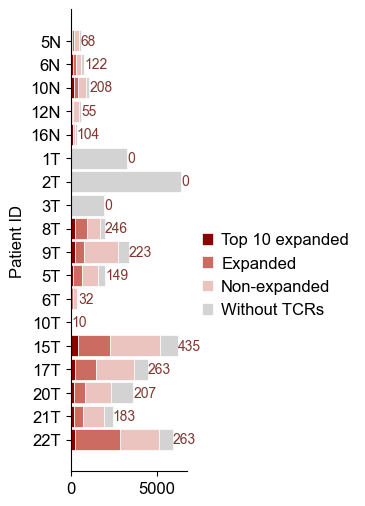

In [1195]:
fig0, ax0 = plt.subplots(figsize=(1.5, 6))
colors=['darkred','#cc6b61', '#ebc4c0', 'lightgrey']
age_df.columns = ['Top 10 expanded','Expanded', 'Non-expanded', 'Without TCRs']
countPlot(age_df, ax=ax0, barlabels=barlabels, colors=colors, bar_label='0')
fig0.savefig(f"{figPath}/4g-proportions1.svg",bbox_inches='tight')

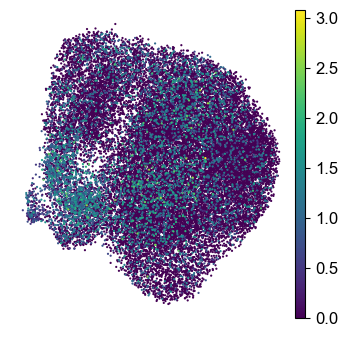

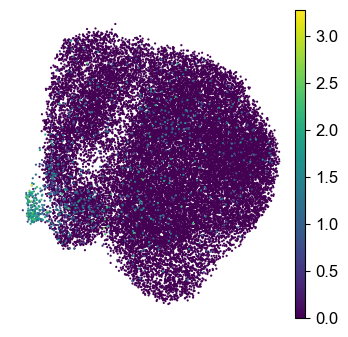

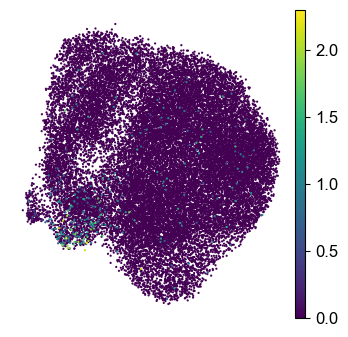

In [218]:
for gene in ['ITGAE','MKI67', 'CD200']:
  fig, ax = plt.subplots(1, 1, figsize=(4, 4))
  sc.pl.umap(adata_CD8T, color=gene,size=10, ax=ax, title='',show=False, use_raw=False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  ax.set_xlabel("")
  ax.set_ylabel("")
  # ax.legend(  handletextpad=0.5, frameon=False,
  #                     borderpad=0.6,
  #                     columnspacing=1.3,
  #                     handlelength=0.65, fontsize=12)
  fig.savefig(f"figure-1.23/S1b-{gene}.png", dpi=400, bbox_inches='tight')

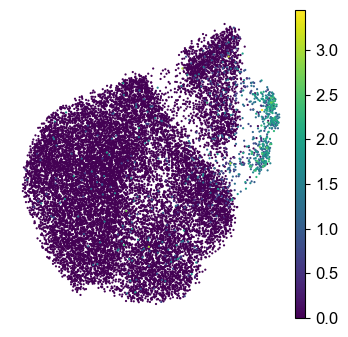

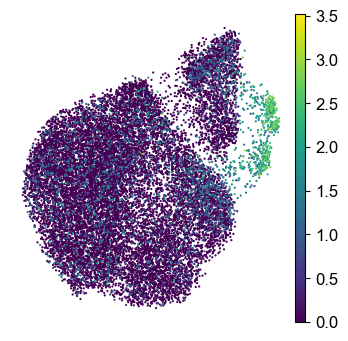

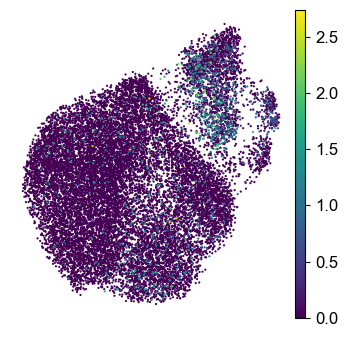

In [219]:
for gene in ['MKI67', 'STMN1', 'CD200']:
  fig, ax = plt.subplots(1, 1, figsize=(4, 4))
  sc.pl.umap(adata_CD4T, color=gene,size=10, ax=ax, title='',show=False, use_raw=False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  ax.set_xlabel("")
  ax.set_ylabel("")
  # ax.legend(  handletextpad=0.5, frameon=False,
  #                     borderpad=0.6,
  #                     columnspacing=1.3,
  #                     handlelength=0.65, fontsize=12)
  fig.savefig(f"figure-1.23/S4e-{gene}.png", dpi=400, bbox_inches='tight')

In [27]:
def anno(adata:ad.AnnData, annoDict:dict, obsKey='cnv_status', obsVal='cnv_leiden', default="Unknown"):
  if default is not None:
    adata.obs[obsKey] = default
  for key in annoDict.keys():
    adata.obs.loc[adata.obs[obsVal].isin(annoDict[key]), obsKey] = key
  return adata

In [28]:
mdata_CD8T.obs['gex:clonal_size'] = mdata_CD8T.obs['airr:clonal_expansion']
adata_CD8T.obs['clonal_size'] = mdata_CD8T.obs['airr:clonal_expansion']

In [31]:
mdata_CD4T.obs['gex:clonal_size'] = mdata_CD4T.obs['airr:clonal_expansion']
adata_CD4T.obs['clonal_size'] = mdata_CD4T.obs['airr:clonal_expansion']

In [32]:
annot = {
  40: ['<= 40','> 40'],
  20: ['<= 20'],
  10: ['<= 10'],
  5: ['<= 5'],
  3: ['<= 2'],
}
adata_CD8T = anno(adata_CD8T, annot, 'spot_size', 'clonal_size', 2)

In [33]:
annot = {
  40: ['<= 40','> 40'],
  20: ['<= 20'],
  10: ['<= 10'],
  5: ['<= 5'],
  2: ['<= 2'],
}
adata_CD4T = anno(adata_CD4T, annot, 'spot_size', 'clonal_size', 2)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


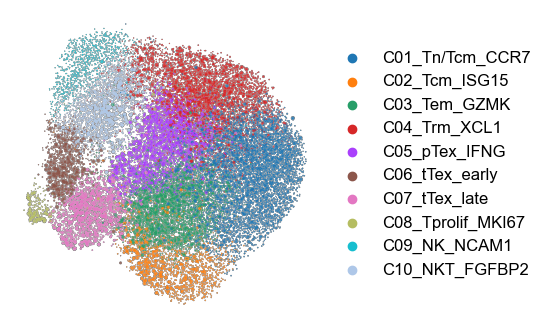

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD8T,color=['anno-newCD8T'], 
           size=adata_CD8T.obs['spot_size'], 
           alpha=0.8, add_outline=True, 
           palette=sc.pl.palettes.vega_20_scanpy,
           outline_color=('#5c5a5a','lightgrey'),
           outline_width=(0.15,0.02),
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-anno_CD8T_clonal.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


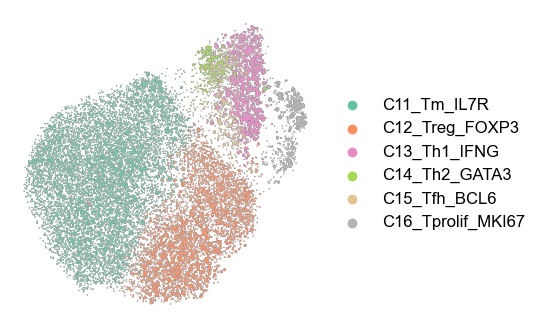

In [304]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD4T,color=['anno-CD4T'], 
           size=adata_CD4T.obs['spot_size'], 
           alpha=0.8, add_outline=True, 
           palette='Set2',
           outline_color=('#5c5a5a','lightgrey'),
           outline_width=(0.15,0.02),
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-anno_CD4T_clonal.png', dpi=400, bbox_inches='tight')

In [58]:
annoT = pd.concat([adata_CD4T.obs['anno-CD4T'], adata_CD8T.obs['anno-newCD8T']], axis=0)
annoT = annoT.astype('category')

In [59]:
mdata_CD8T.obs["airr:anno-T"] = annoT

In [60]:
ir.tl.repertoire_overlap(mdata_CD8T, groupby="airr:anno-T")

In [ ]:
mdata_CD8T.obs['airr:majorType'] = tcr['majorType']

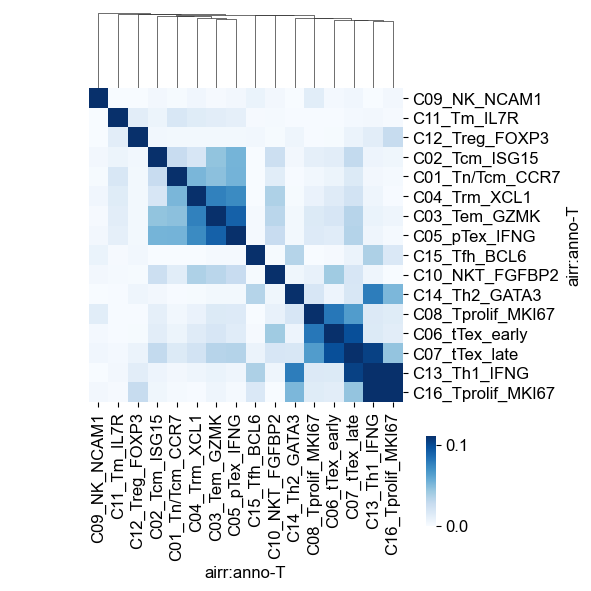

In [61]:
from scipy.cluster import hierarchy as sc_hierarchy
from scipy.spatial import distance as sc_distance
from scirpy.util import DataHandler
params = DataHandler(mdata_CD8T, 'airr')
added_key = "repertoire_overlap"
overlap_measure = "jaccard"
df = params.adata.uns[added_key]["weighted"]
linkage = params.adata.uns[added_key]["linkage"]
distM = params.adata.uns[added_key]["distance"]
distM = sc_distance.squareform(distM)
np.fill_diagonal(distM, np.nan)
distM = pd.DataFrame(distM, index=df.index, columns=df.index)
dd = sc_hierarchy.dendrogram(linkage, labels=df.index, no_plot=True)
distM = distM.iloc[dd["leaves"], :]
distM = distM.fillna(distM.min().min())
ax = sns.clustermap(1 - distM, 
                    col_linkage=linkage, 
                    row_cluster=False, 
                    cmap='Blues', cbar_pos=(0.85, -0.05, 0.02, 0.18))
# cbar_pos=(0.92, 0, 0.02, 0.18)
# b, t = ax.ax_row_dendrogram.get_ylim()
# l, r = ax.ax_row_dendrogram.get_xlim()
# ax.ax_row_dendrogram.text(l, 0.9 * t, f"1-dist({overlap_measure})")
ax.fig.set_size_inches(5, 5)
ax.fig.savefig(f"{figPath}/4j-repertoire_overlap_Blues.svg", bbox_inches='tight')

In [245]:
ir.pp.ir_dist(mdata_CD8T, metric="alignment", sequence="aa", cutoff=15)
ir.tl.define_clonotype_clusters(mdata_CD8T, sequence="aa", metric="alignment", receptor_arms="all", dual_ir="any")
ir.tl.clonotype_network(mdata_CD8T, min_cells=10, sequence="aa", metric="alignment")

  0%|          | 0/528 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build de

  0%|          | 0/528 [00:00<?, ?it/s]

  0%|          | 0/27050 [00:00<?, ?it/s]

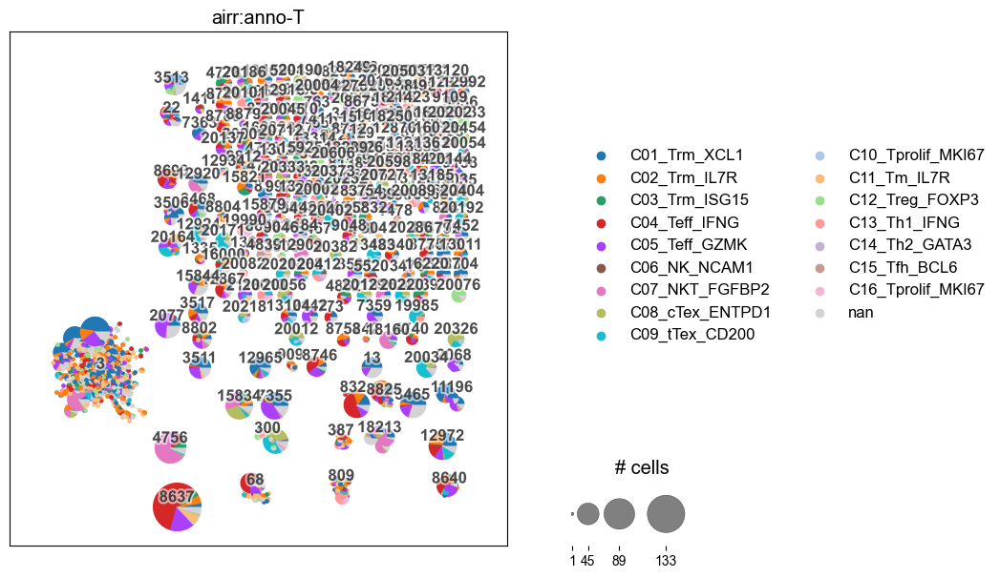

In [312]:
ir.pl.clonotype_network(mdata_CD8T, color="airr:anno-T", label_fontsize=12, panel_size=(7,7), base_size=6).figure.savefig(f"{figPath}/clono_netcluster_anno.svg")

  0%|          | 0/10162 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

<AxesSubplot: xlabel='modularity score', ylabel='-log10(FDR)'>

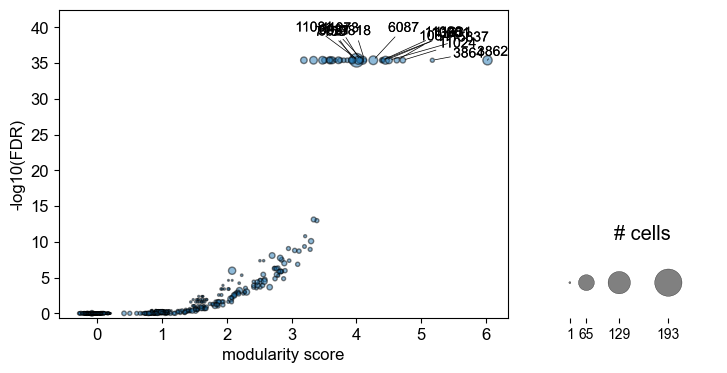

In [313]:
ir.tl.clonotype_modularity(mdata_CD8T)
ir.pl.clonotype_modularity(mdata_CD8T)

In [203]:
mdata_CD8T.obs['airr:anno-CD8T'] = mdata_CD8T.obs['gex:anno-CD8T']
mdata_CD4T.obs['airr:anno-CD4T'] = mdata_CD4T.obs['gex:anno-CD4T']

In [336]:
mdata_CD8T['airr'].obs['anno-CD8T'] = mdata_CD8T.obs['gex:anno-CD8T']
mdata_CD8T['airr'].obs.columns

Index(['receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id',
       'clone_id_size', 'clonal_expansion', 'clonotype_modularity',
       'cc_aa_alignment', 'cc_aa_alignment_size', 'clonotype_modularity_fdr',
       'normalized_shannon_entropy_clone_id', 'anno-CD8T'],
      dtype='object')

In [ ]:
mdata_CD8T['airr'].obs['anno-CD8T'] = mdata_CD8T.obs['gex:anno-CD8T']
mdata_CD8T['airr'].obs.columns
mdata_CD4T['airr'].obs['anno-CD4T'] = mdata_CD4T.obs['gex:anno-CD4T']
mdata_CD4T['airr'].obs.columns

Index(['receptor_type', 'receptor_subtype', 'chain_pairing', 'clone_id',
       'clone_id_size', 'clonal_expansion', 'clonotype_modularity',
       'cc_aa_alignment', 'cc_aa_alignment_size', 'clonotype_modularity_fdr',
       'normalized_shannon_entropy_clone_id', 'anno-CD8T',
       'alpha_div_anno-CD8T', 'anno-CD4T'],
      dtype='object')

In [ ]:
ir.tl.alpha_diversity(mdata_CD8T, groupby='anno-CD8T', key_added='alpha_div_anno-CD8T')
ir.tl.alpha_diversity(mdata_CD4T, groupby='anno-CD4T', key_added='alpha_div_anno-CD4T')

In [361]:
alpha_CD8T = mdata_CD8T['airr'].obs[['anno-CD8T','alpha_div_anno-CD8T']].dropna().drop_duplicates()
alpha_CD8T.index = alpha_CD8T['anno-CD8T']
alpha_CD8T = alpha_CD8T.drop(columns=['anno-CD8T'])
alpha_CD8T = alpha_CD8T.sort_index()
cluProfile_CD8T['alpha_div'] = alpha_CD8T['alpha_div_anno-CD8T']
cluProfile_CD8T

,airr:clone_id_size,airr:clone_id_size,clone_size_per_cell,majorType,airr:clone_expanded,cell_size,clone_expanded_ratio,alpha_div
gex:anno-CD8T,,,,,,,,
C01_Trm_XCL1,28937.0,2984,9.697386,CD8,2984,3777,0.790045,0.956283
C02_Trm_IL7R,19113.0,4833,3.954687,CD8,4833,5853,0.825730,0.989910
C03_Trm_ISG15,7091.0,1058,6.702268,CD8,1058,1271,0.832415,0.981244
C04_Teff_IFNG,40276.0,2265,17.781898,CD8,2265,2699,0.839200,0.937967
C05_Teff_GZMK,26373.0,2294,11.496513,CD8,2294,2822,0.812899,0.963674
C06_NK_NCAM1,205.0,46,4.456522,NK,46,850,0.054118,0.995819
C07_NKT_FGFBP2,14092.0,950,14.833684,NKT,950,1861,0.510478,0.914352
C08_cTex_ENTPD1,7002.0,653,10.722818,CD8,653,855,0.763743,0.939439
C09_tTex_CD200,10668.0,1098,9.715847,CD8,1098,1222,0.898527,0.945161


In [364]:
alpha_CD4T = mdata_CD4T['airr'].obs[['anno-CD4T','alpha_div_anno-CD4T']].dropna().drop_duplicates()
alpha_CD4T.index = alpha_CD4T['anno-CD4T']
alpha_CD4T = alpha_CD4T.drop(columns=['anno-CD4T'])
alpha_CD4T = alpha_CD4T.sort_index()
cluProfile_CD4T['alpha_div'] = alpha_CD4T['alpha_div_anno-CD4T']
cluProfile_CD4T

,airr:clone_id_size,airr:clone_id_size,clone_size_per_cell,majorType,airr:clone_expanded,cell_size,clone_expanded_ratio,alpha_div
gex:anno-CD4T,,,,,,,,
C11_Tm_IL7R,10552.0,6338,1.664879,CD4,6338,7642,0.829364,0.997614
C12_Treg_FOXP3,8229.0,3101,2.653660,CD4,3101,3292,0.941981,0.977647
C13_Th1_IFNG,4404.0,854,5.156909,CD4,854,896,0.953125,0.960733
C14_Th2_GATA3,721.0,122,5.909836,CD4,122,132,0.924242,0.983565
C15_Tfh_BCL6,672.0,266,2.526316,CD4,266,287,0.926829,0.982985
C16_Tprolif_MKI67,1540.0,308,5.000000,CD4,308,334,0.922156,0.985838


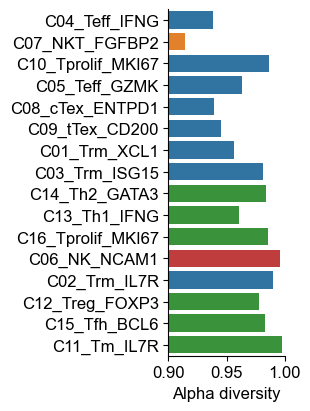

In [373]:
cluProfile = pd.concat([cluProfile_CD8T, cluProfile_CD4T], axis=0)
cluProfile['name'] = cluProfile.index
cluProfile = cluProfile.sort_values(by='clone_size_per_cell', ascending=False)
import seaborn as sns
fig, ax = plt.subplots(figsize=(1.5, 4.5))
sns.barplot(data=cluProfile, y='name', x='alpha_div', hue='majorType', orient='h', ax=ax)
ax.set_xlabel("Alpha diversity")
ax.set_xlim((0.9, 1))
ax.set_ylabel("")
ax.legend().set_visible(False)
ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
fig.savefig(f"{figPath}/4f-alpha_div.svg", bbox_inches='tight')

### Run differential abundance analysis via miloR

In [10]:
adata_CD4T = sc.read_h5ad('adata-CD4T-1.26.h5ad')
adata_CD8T = sc.read_h5ad('adata-CD8T-1.26.h5ad')
adata_CD4T_old = sc.read_h5ad('adata-CD4T-old-1.26.h5ad')
adata_CD8T_old = sc.read_h5ad('adata-CD8T-old-1.26.h5ad')

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [1]:
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


In [2]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

In [3]:
anndata2ri.activate()

/tmp/ipykernel_1912653/4016445965.py:1: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [4]:
%load_ext rpy2.ipython

In [11]:
%%R
library(miloR)
library(igraph)

In [12]:
def anno(adata:ad.AnnData, annoDict:dict, obsKey='cnv_status', obsVal='cnv_leiden', default="Unknown"):
  if default is not None:
    adata.obs[obsKey] = default
  for key in annoDict.keys():
    adata.obs.loc[adata.obs[obsVal].isin(annoDict[key]), obsKey] = key
  return adata

In [17]:
def prepare_miloR(adata:ad.AnnData, conDict:dict, condName, condVal, batch='batch'):
  adata_no_knn = adata.copy()
  adata_no_knn.obsp = None
  adata_no_knn.uns.pop("neighbors")
  knn_adjacency = adata.obsp["connectivities"]
  adata_no_knn = anno(adata_no_knn, annoDict=conDict, obsKey=condName, obsVal=condVal)
  adata_no_knn.obs[condName] = adata_no_knn.obs[condName].astype('category')
  print(adata_no_knn.obs[condName].cat.categories)
  design_df = adata_no_knn.obs[[batch,condName]]
  design_df.drop_duplicates(inplace=True)
  design_df.index = design_df['batch']
  return adata_no_knn, knn_adjacency, design_df

Prepare data for miloR

In [103]:
conDict_CD8_HRHER2 = {
  'aTNBC': ['HER2' ,],
  'others': ['Normal','TNBC','Luminal B','LumB-HER2']
}
adata_no_knn, knn_adjacency, design_df = prepare_miloR(adata_CD8T, conDict_CD8_HRHER2, 'TorN', 'molecular_type')

Index(['aTNBC', 'others'], dtype='object')


/tmp/ipykernel_1912653/3671355112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df.drop_duplicates(inplace=True)


Build MiloR object in Rscript

In [79]:
%%R -i adata_no_knn
library(ggplot2)
library(ggbeeswarm)
library(colorspace)
milo <- Milo(adata_no_knn)

In [80]:
%%R -i knn_adjacency
milo_graph <- buildFromAdjacency(knn_adjacency, k=20, is.binary=TRUE)
graph(milo) <- miloR::graph(milo_graph)

milo <- buildGraph(milo, k=20, d=30)

## Define neighbourhoods
milo <- makeNhoods(milo, prop = 0.1, k = 20, d=30, refined = TRUE)
## Count cells in neighbourhoods
milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="batch")

## Calculate distances between cells in neighbourhoods
## for spatial FDR correction
milo <- calcNhoodDistance(milo, d=30)

Constructing kNN graph with k:20
Checking valid object
Running refined sampling with reduced_dim
Checking meta.data validity
Counting cells in neighbourhoods


In [104]:
%%R -i design_df -o DA_results

## Test for differential abundance
DA_results <- testNhoods(milo, design = ~ TorN, design.df = design_df)

## Annotate differential abundance
milo <- buildNhoodGraph(milo)
DA_results <- annotateNhoods(milo, DA_results, coldata_col = "anno.CD8T")


Using TMM normalisation
Performing spatial FDR correction withk-distance weighting
In addition: Warning message:
In testNhoods(milo, design = ~TorN, design.df = design_df) :
  Sample names in design matrix and nhood counts are not matched. Reordering


In [105]:
%%R 
DA_results <- DA_results[order(DA_results[['anno.CD8T']], decreasing=T), ]
p <- ggplot(DA_results, aes(x = logFC, y = anno.CD8T)) +
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR > 0.1,], alpha=0.5, colour='grey50', size=1) + 
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR <= 0.1,], aes(colour=logFC, alpha=abs(logFC)), size=1.5) + 
  geom_violin(color = "#44403f", alpha=0) +
  theme_bw() +
  scale_colour_gradient2(low=darken('blue'), mid='grey80', high=darken('#ff0000'), midpoint=0) +
  labs(x="Log Fold Change", y="CD8T subtypes") +
  theme(axis.text.y=element_text(size=12,colour='black'), axis.title.y=element_text(size=14),
        axis.text.x=element_text(size=12,colour='black'), axis.title.x=element_text(size=14),
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank()) +
  stat_summary(aes(label = sprintf("%.2f",..x..)),
        fun = mean, geom = "text") +
  guides(colour=FALSE, alpha=FALSE)
ggsave("~/figure-1.23/DA_CD8_HR-HER2+.pdf", p, width = 4.5, height = 4.5, units = "in")


Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`
Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`


In [ ]:
DA_results.to_csv(f"{figPath}/DA_CD8_HR-HER2+.csv")

In [108]:
adata_raw = sc.read_h5ad('BCY-adata-concat.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 266942 × 61487
    obs: 'batch'

In [ ]:
adata_raw.obs_names = [f"{s.split('-')[0]}-{s.split('-')[-1]}" for s in adata_raw.obs_names]

View of AnnData object with n_obs × n_vars = 27672 × 61487
    obs: 'batch'

In [ ]:
adata_CD8T.raw = adata_raw[adata_raw.obs_names.isin(adata_CD8T.obs_names), adata_raw.var_names.isin(adata_CD8T.var_names)]
adata_CD4T.raw = adata_raw[adata_raw.obs_names.isin(adata_CD4T.obs_names), adata_raw.var_names.isin(adata_CD4T.var_names)]

In [186]:
adata_CD8T.write_h5ad("adata-CD8T-3.3.h5ad")
adata_CD4T.write_h5ad("adata-CD4T-3.3.h5ad")

In [124]:
adata_CD8T.raw.X

<27672x41733 sparse matrix of type '<class 'numpy.float32'>'
	with 27701355 stored elements in Compressed Sparse Row format>

## Run cell-cycle phase inferrence with CytoTRACE2

In [125]:
import datatable as dt
from cytotrace2_py.cytotrace2_py import cytotrace2
def prep_cyto(adata:ad.AnnData, anno:str, rawpath:str, annopath:str):
  print("Converting AnnData to CytoTrace2 format...")
  cyto = adata.raw.X.astype('int')
  adata.obs_names_make_unique()
  adata.var_names_make_unique()
  cyto = pd.DataFrame(cyto.todense(), index=list(adata.obs_names), columns=list(adata.var_names)).T
  cyto = cyto.reset_index()
  cyto = dt.Frame(cyto)
  print("Writing CytoTrace2 files...")
  cyto.to_csv(rawpath, sep='\t', compression='gzip')
  cyto_anno = pd.DataFrame(list(adata.obs_names), columns=['cell IDs'])
  cyto_anno['phenotype'] = list(adata.obs[anno])
  cyto_anno.to_csv(annopath, sep='\t', index=False, header=True)
  print("Writing CytoTrace2 files finished...")

In [126]:
prep_cyto(adata_CD8T, anno='anno-CD8T', 
          rawpath='BCY-CD8T-cytotrace2-3.3.tsv.gz', 
          annopath='BCY-CD8T-cytotrace2-anno-3.3.tsv')

Converting AnnData to CytoTrace2 format...
Writing CytoTrace2 files...
Writing CytoTrace2 files finished...


In [127]:
cyto_CD8T = cytotrace2('BCY-CD8T-cytotrace2-3.3.tsv.gz',
                     annotation_path = 'BCY-CD8T-cytotrace2-anno-3.3.tsv',
                     species='human',
                     batch_size=10000,
                     smooth_batch_size=1000,
                     max_cores=24,
                     seed=14,
                     disable_plotting = True,
                     disable_parallelization=False)

cytotrace2: Input parameters
    Input file: BCY-CD8T-cytotrace2-3.3.tsv.gz
    Species: human
    Parallelization enabled: True
    Batch size: 10000
    Smoothing batch size: 1000
    Seed: 14
    Output directory: cytotrace2_results
    Plotting enabled: False
    Verbose mode enabled: True
    User-provided limit for number of cores to use: 24
cytotrace2: Dataset characteristics
    Number of input genes:  41733
    Number of input cells:  27672
cytotrace2: Checking models...
All model files are present.
cytotrace2: Preprocessing
cytotrace2: Running 3 prediction batch(es) sequentially using 10 cores per batch.
cytotrace2: Initiated processing batch 1/3 with 9224 cells
    Mapped 13803 input gene names to mouse orthologs
    13802 input genes are present in the model features.
cytotrace2: Performing initial model prediction
cytotrace2: Performing smoothing by diffusion
cytotrace2: Performing smoothing by adaptive KNN
cytotrace2: Initiated processing batch 2/3 with 9224 cells
    Map

In [128]:
prep_cyto(adata_CD4T, anno='anno-CD4T', 
          rawpath='BCY-CD4T-cytotrace2-3.3.tsv.gz', 
          annopath='BCY-CD4T-cytotrace2-anno-3.3.tsv')

Converting AnnData to CytoTrace2 format...
Writing CytoTrace2 files...
Writing CytoTrace2 files finished...


In [129]:
cyto_CD4T = cytotrace2('BCY-CD4T-cytotrace2-3.3.tsv.gz',
                     annotation_path = 'BCY-CD4T-cytotrace2-anno-3.3.tsv',
                     species='human',
                     batch_size=10000,
                     smooth_batch_size=1000,
                     max_cores=24,
                     seed=14,
                     disable_plotting = True,
                     disable_parallelization=False)

cytotrace2: Input parameters
    Input file: BCY-CD4T-cytotrace2-3.3.tsv.gz
    Species: human
    Parallelization enabled: True
    Batch size: 10000
    Smoothing batch size: 1000
    Seed: 14
    Output directory: cytotrace2_results
    Plotting enabled: False
    Verbose mode enabled: True
    User-provided limit for number of cores to use: 24
cytotrace2: Dataset characteristics
    Number of input genes:  41733
    Number of input cells:  17949
cytotrace2: Checking models...
All model files are present.
cytotrace2: Preprocessing
cytotrace2: Running 2 prediction batch(es) sequentially using 10 cores per batch.
cytotrace2: Initiated processing batch 1/2 with 8975 cells
    Mapped 13803 input gene names to mouse orthologs
    13802 input genes are present in the model features.
cytotrace2: Performing initial model prediction
cytotrace2: Performing smoothing by diffusion
cytotrace2: Performing smoothing by adaptive KNN
cytotrace2: Initiated processing batch 2/2 with 8974 cells
    Map

In [132]:
adata_CD8T.obs = pd.concat([adata_CD8T.obs, cyto_CD8T],axis=1)
adata_CD4T.obs = pd.concat([adata_CD4T.obs, cyto_CD4T],axis=1)

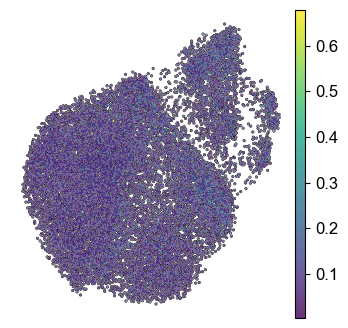

In [143]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD4T,color=['CytoTRACE2_Score'], 
           alpha=0.8, add_outline=True, 
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD4T.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


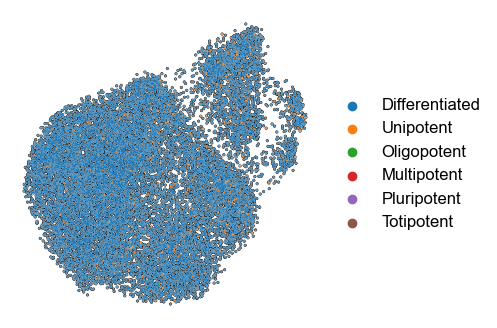

In [374]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD4T,color=['CytoTRACE2_Potency'], 
           alpha=0.8, add_outline=True, 
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD4T_Potency.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


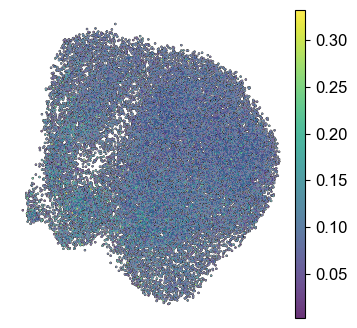

In [375]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD8T,color=['CytoTRACE2_Score'], 
           alpha=0.8, add_outline=True, 
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD8T.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


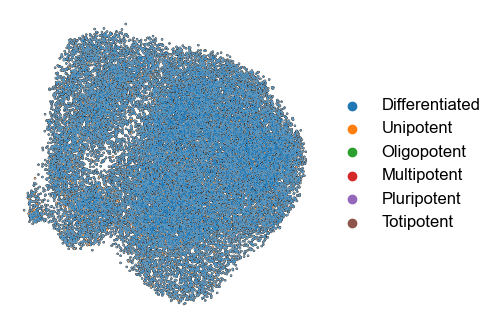

In [376]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sc.pl.umap(adata_CD8T,color=['CytoTRACE2_Potency'], 
           alpha=0.8, add_outline=True, 
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD8T_Potency.png', dpi=400, bbox_inches='tight')

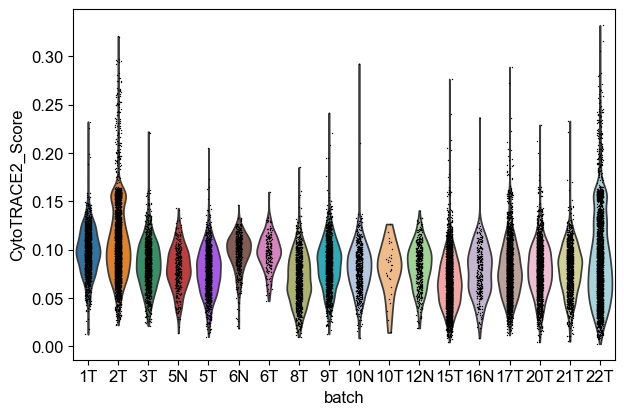

In [381]:
sc.pl.violin(adata_CD8T, keys=['CytoTRACE2_Score'], groupby='batch')

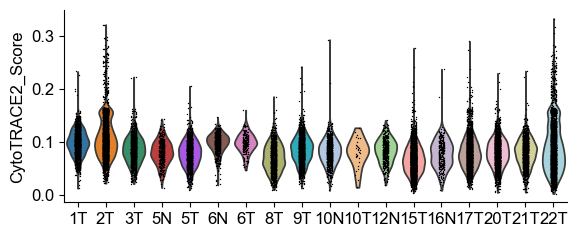

In [387]:
fig, ax = plt.subplots(1, 1, figsize=(6.5, 2.5))
sc.pl.violin(adata_CD8T, keys=['CytoTRACE2_Score'], groupby='batch', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xlabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD8T_violin.png', dpi=400, bbox_inches='tight')

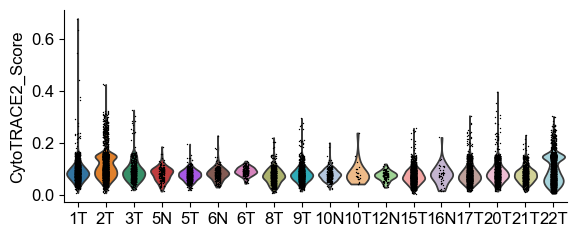

In [388]:
fig, ax = plt.subplots(1, 1, figsize=(6.5, 2.5))
sc.pl.violin(adata_CD4T, keys=['CytoTRACE2_Score'], groupby='batch', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.set_xlabel("")
fig.savefig(f'{figPath}/S4f-CytoTRACE2_CD4T_violin.png', dpi=400, bbox_inches='tight')

## Run gene set score evaluation

In [42]:
cytogenes = ['PRF1', 'GZMA', 'GZMB', 'GNLY', 'NKG7', 'GZMK', 'IFNG', 'TNFAIP3', 'IL2RA', 'GZMH', 'ITGAL', 'ITGB2']
exgenes = ['PDCD1', 'HAVCR2', 'TIGIT', 'CTLA4', 'LAG3', 'ENTPD1', 'CD200', 'TOX']
infgenes = ["CCL2", "CCL3", "CCL4", "CCL5", "CXCL10", "CXCL9", "IL1B", "IL6", "IL7", "IL15", "IL18"]
stressgenes = ["BAG3", "CALU", "DNAJB1", "DUSP1", "EGR1", "FOS", "FOSB", "HIF1A", "HSP90AA1", "HSP90AB1", "HSP90B1", "HSPA1A", "HSPA1B", "HSPA6", "HSPB1", "HSPH1", "IER2", "JUN", "JUNB", "NFKBIA", "NFKBIZ", "RGS2", "SLC2A3", "SOCS3", "UBC", "ZFAND2A", "ZFP36", "ZFP36L1"]

In [64]:
sc.tl.score_genes(adata_CD8T, gene_list=cytogenes, score_name='cytotoxicity', use_raw=False)
sc.tl.score_genes(adata_CD8T, gene_list=exgenes, score_name='exhaustion', use_raw=False)
sc.tl.score_genes(adata_CD8T, gene_list=infgenes, score_name='inflammation', use_raw=False)
sc.tl.score_genes(adata_CD8T, gene_list=stressgenes, score_name='stress', use_raw=False)
sc.tl.score_genes(adata_CD4T, gene_list=cytogenes, score_name='cytotoxicity', use_raw=False)
sc.tl.score_genes(adata_CD4T, gene_list=exgenes, score_name='exhaustion', use_raw=False)
sc.tl.score_genes(adata_CD4T, gene_list=infgenes, score_name='inflammation', use_raw=False)
sc.tl.score_genes(adata_CD4T, gene_list=stressgenes, score_name='stress', use_raw=False)

In [65]:
Tdf_CD8 = adata_CD8T.obs[['cytotoxicity', 'exhaustion', 'inflammation', 'stress', 'anno-newCD8T']]
Tdf_CD8.columns = ['cytotoxicity', 'exhaustion', 'inflammation', 'stress', 'annotation']
Tdf_CD4 = adata_CD4T.obs[['cytotoxicity', 'exhaustion', 'inflammation', 'stress', 'anno-CD4T']]
Tdf_CD4.columns = ['cytotoxicity', 'exhaustion', 'inflammation', 'stress', 'annotation']
Tdf = pd.concat([Tdf_CD8, Tdf_CD4], axis=0)
Tdf

,cytotoxicity,exhaustion,inflammation,stress,annotation
AAACCCAGTGGTAATA-1T,-0.011852,-0.136375,0.152165,0.723819,C01_Tn/Tcm_CCR7
AAACGAAGTGCGAGTA-1T,0.218737,-0.144509,0.158971,0.209305,C03_Tem_GZMK
AAACGAATCCGCTAGG-1T,-0.091196,-0.099638,0.194024,0.514939,C03_Tem_GZMK
AAAGAACAGCCGTTGC-1T,0.156639,-0.126370,-0.054992,0.233673,C02_Tcm_ISG15
AAAGAACCAAACTGCT-1T,-0.072353,-0.124435,0.056297,0.246608,C01_Tn/Tcm_CCR7
...,...,...,...,...,...
TTGACTTGTATTCTCT-22T,0.250982,-0.195289,-0.102766,0.045725,C12_Treg_FOXP3
TTGCCGTAGTTAGCGG-22T,0.360332,0.173788,-0.071653,0.463891,C16_Tprolif_MKI67
TTGTAGGTCCCGGATG-22T,0.457872,-0.069312,-0.008200,0.130349,C12_Treg_FOXP3
TTTATGCAGCTAACTC-22T,0.178709,0.146078,-0.025342,1.028650,C16_Tprolif_MKI67


/tmp/ipykernel_1475195/240524092.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(Tdf, x=x, y='annotation', orient='h', order=sorted(Tdf['annotation'].unique()),
/tmp/ipykernel_1475195/240524092.py:4: UserWarning: The palette list has more values (20) than needed (16), which may not be intended.
  sns.boxplot(Tdf, x=x, y='annotation', orient='h', order=sorted(Tdf['annotation'].unique()),
/tmp/ipykernel_1475195/240524092.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(Tdf, x=x, y='annotation', orient='h', order=sorted(Tdf['annotation'].unique()),
/tmp/ipykernel_1475195/240524092.py:4: UserWarning: The palette list has more values (20) than needed (16), which may not be intended.
  sn

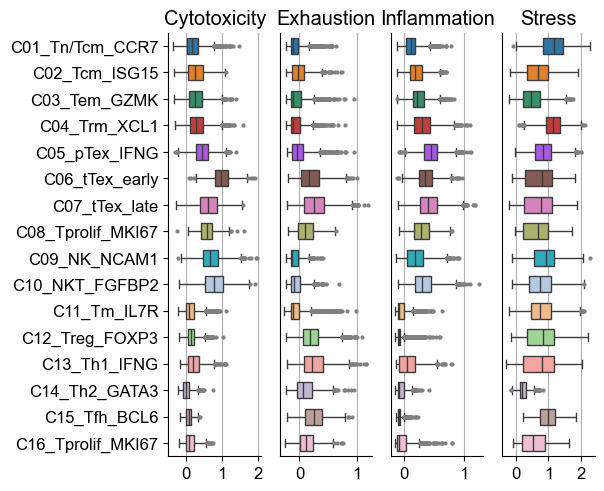

In [66]:
fig, ax = plt.subplots(1, 4, figsize=(5.5, 5.5))
flierprops = dict(markerfacecolor='grey', marker='.', markersize=4, linestyle='none', markeredgecolor='grey')
for i, x in enumerate(['cytotoxicity', 'exhaustion', 'inflammation', 'stress']):
  sns.boxplot(Tdf, x=x, y='annotation', orient='h', order=sorted(Tdf['annotation'].unique()),
              palette=sc.pl.palettes.default_20, width=0.6,ax=ax[i], flierprops=flierprops, showfliers=True)
  if i > 0:
    ax[i].set_yticklabels([])
    ax[i].tick_params(axis='y', length=0)
  ax[i].set_xlabel('')
  x_min, x_max = ax[i].get_xlim()
  start = np.ceil(x_min *2) / 2
  xticks = np.arange(start, x_max, 1)
  ax[i].set_xticks(xticks)
  ax[i].xaxis.grid(True)
  ax[i].spines['top'].set_visible(False)
  ax[i].spines['right'].set_visible(False)
  ax[i].set_ylabel('')
  ax[i].set_title(x.capitalize())
fig.savefig(f"{figPath}/4i-scores_annotation.svg", bbox_inches='tight')

In [538]:
adata_CD8T.obs['anno-CD8T'].cat.categories

Index(['C01_Trm_XCL1', 'C02_Trm_IL7R', 'C03_Trm_ISG15', 'C04_Teff_IFNG',
       'C05_Teff_GZMK', 'C06_NK_NCAM1', 'C07_NKT_FGFBP2', 'C08_cTex_ENTPD1',
       'C09_tTex_CD200', 'C10_Tprolif_MKI67'],
      dtype='object')

In [539]:
import memento
adata_Tex = adata_CD8T[adata_CD8T.obs['anno-CD8T'].isin(['C04_Teff_IFNG',
       'C05_Teff_GZMK', 'C07_NKT_FGFBP2', 'C08_cTex_ENTPD1',
       'C09_tTex_CD200', 'C10_Tprolif_MKI67'])].copy()
adata_Tex

AnnData object with n_obs × n_vars = 13114 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'leiden-T', 'leiden-Tmix', 'leiden-CD8T', 'anno-CD8T', 'sample', 'tech', 'anno-CD8T-har', 'cptype', 'cytotoxicity', 'MANAscore', 'exhaustion', 'CytoTRACE2_Score', 'CytoTRACE2_Potency', 'CytoTRACE2_Relative', 'preKNN_CytoTRACE2_Score', 'preKNN_CytoTRACE2_Potency', 'clonal_size', 'spot_size'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'anno-CD8T-har_colors', 'anno-CD8T_colors', 'batch_colors', 'dendrogram_an

In [605]:
import memento
def DE_memento(adata: ad.AnnData, ctleft: list, ctright: list, groupby='anno-CD8T'):
  _adata = adata[adata.obs[groupby].isin(ctleft + ctright)].copy()
  _adata.obs['stim'] = _adata.obs[groupby].isin(ctright)
  _adata.obs['stim'] = _adata.obs['stim'].astype('int')
  _adata.obs['capture_rate'] = 0.07
  memento.setup_memento(_adata, q_column='capture_rate')
  memento.create_groups(_adata, label_columns=['stim'])
  memento.compute_1d_moments(_adata, min_perc_group=.7)
  meta_df = memento.get_groups(_adata)
  meta_df['intercept'] = 1
  convariate = meta_df[['intercept']]
  treatment = (meta_df[['stim']] == 1).astype(float)
  
  memento.ht_1d_moments(_adata,
  covariate=convariate,
  treatment=treatment,
  num_cpus=16,
  resample_rep=False,
  )
  memento_results = memento.get_1d_ht_result(_adata)
  return(memento_results)

In [606]:
DE_tex = DE_memento(adata_CD8T, ['C08_cTex_ENTPD1'], ['C09_tTex_CD200'], groupby='anno-CD8T')
DE_tex

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requi

,gene,tx,de_coef,de_se,de_pval,dv_coef,dv_se,dv_pval
0,TNFRSF4,stim,1.151556,0.147533,8.286236e-15,-0.108155,0.278441,6.019909e-01
1,TNFRSF18,stim,0.624384,0.078268,1.966852e-15,-0.938898,0.161353,4.713494e-09
2,LZIC,stim,-0.114602,0.128792,3.543659e-01,-0.773914,1.428764,5.589777e-01
3,MTATP6P1,stim,0.302195,0.063200,1.791957e-06,-1.406657,0.532912,9.599736e-03
4,CLSTN1,stim,0.061861,0.130195,6.313951e-01,0.918748,1.296758,2.607924e-01
...,...,...,...,...,...,...,...,...
946,DIP2A,stim,-0.123188,0.112030,2.696443e-01,0.891920,1.141038,3.301002e-01
947,BRWD1,stim,-0.227763,0.102745,2.702314e-02,0.675504,1.248459,3.107275e-01
948,ABCG1,stim,0.119281,0.125391,3.507582e-01,0.146277,1.276192,7.670551e-01
949,MX2,stim,-0.197456,0.099143,4.901057e-02,-0.941245,0.444095,3.656565e-02


In [613]:
%%R -i DE_tex
library(ggVolcano)
library(RColorBrewer)
library(ggsci)
data <- add_regulate(DE_tex, log2FC_name = "de_coef",
                     fdr_name = "de_pval",log2FC = 0.4, fdr = 0.05)
# plot
p <- ggvolcano(data, x = "log2FoldChange", y = "padj",
          label = "gene", label_number = 20, output = FALSE, legend_position = "UR",
          log2FC_cut = 0.4, FDR_cut = 1e-5) +
    labs(x="correlation", y="-log P-value")
ggsave("~/figure-1.23/DE_pTex.pdf", p, width = 3.2, height = 3.2, units = "in")

In [545]:
adata_Tex.obs['PD-1_high'] = adata_Tex.obs['anno-CD8T'].isin(['C08_cTex_ENTPD1',
       'C09_tTex_CD200', 'C10_Tprolif_MKI67'])
adata_Tex.obs['PD-1_high'] = adata_Tex.obs['PD-1_high'].astype('int')
adata_Tex.obs['capture_rate'] = 0.07
memento.setup_memento(adata_Tex, q_column='capture_rate')

In [546]:
memento.create_groups(adata_Tex, label_columns=['PD-1_high'])
memento.compute_1d_moments(adata_Tex, min_perc_group=.7)

In [ ]:
meta_df = memento.get_groups(adata_Tex)
meta_df['intercept'] = 1
convariate = meta_df[['intercept']]
treatment = (meta_df[['PD-1_high']] == 1).astype(float)

memento.ht_1d_moments(
  adata_Tex,
  covariate=convariate,
  treatment=treatment,
  num_cpus=16,
  resample_rep=False,
)
memento_results = memento.get_1d_ht_result(adata_Tex)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requi

,gene,tx,de_coef,de_se,de_pval,dv_coef,dv_se,dv_pval
0,MTATP6P1,PD-1_high,-0.239415,0.031724,4.235468e-14,-0.704962,0.337716,0.052236
1,CLSTN1,PD-1_high,-0.153512,0.068396,2.509046e-02,-0.428542,1.124325,0.396288
2,PHACTR4,PD-1_high,0.022173,0.074029,7.796589e-01,0.415462,0.858823,0.511759
3,KIAA0319L,PD-1_high,-0.036251,0.075668,6.415766e-01,0.365448,0.953044,0.612343
4,TUT4,PD-1_high,-0.254117,0.050333,4.216880e-07,-0.880512,1.119089,0.215766
...,...,...,...,...,...,...,...,...
706,TTC3,PD-1_high,-0.371105,0.047868,9.681792e-15,-0.525021,1.038510,0.535545
707,DIP2A,PD-1_high,-0.476203,0.058244,3.756254e-16,0.224586,0.851147,0.642309
708,BRWD1,PD-1_high,-0.182798,0.056757,1.296488e-03,-0.910901,1.166308,0.223560
709,ABCG1,PD-1_high,-0.053436,0.068240,4.322628e-01,-0.551698,1.079244,0.384477


In [553]:
memento_results['mem_de_logp'] = -np.log10(memento_results['de_pval'])
memento_results['mem_dv_logp'] = -np.log10(memento_results['dv_pval'])

/home/rzh/BCY/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [564]:
memento_results.sort_values('de_coef').tail(20)

,gene,tx,de_coef,de_se,de_pval,dv_coef,dv_se,dv_pval,mem_de_logp,mem_dv_logp
630,PCNA,PD-1_high,0.661085,0.057573,1.970244e-30,-0.046662,0.767423,9.074181e-01,29.705480,0.042193
471,KLRC1,PD-1_high,0.667602,0.049019,3.205528e-42,1.078451,0.092149,9.333702e-32,41.494100,31.029946
545,DNAJA4,PD-1_high,0.690332,0.061222,2.040913e-29,1.169025,0.213671,3.326682e-08,28.690175,7.477989
9,LMO4,PD-1_high,0.692364,0.052869,3.398825e-39,0.505887,0.428810,1.806564e-01,38.468671,0.743147
25,RGS16,PD-1_high,0.761462,0.057736,9.845059e-40,1.839352,0.097102,3.137836e-80,39.006782,79.503370
33,STMN1,PD-1_high,0.774031,0.043122,6.633736e-72,1.606609,0.085226,3.471159e-79,71.178242,78.459525
461,IFNG,PD-1_high,0.797623,0.028327,8.059839e-174,-3.523168,1.124433,8.647162e-04,173.093674,3.063126
30,ID3,PD-1_high,0.798414,0.049171,2.502541e-59,0.876126,0.151686,5.450572e-09,58.601619,8.263558
467,CCND2,PD-1_high,0.805376,0.040185,2.356225e-89,0.005235,0.292385,8.799514e-01,88.627783,0.055541
475,CD9,PD-1_high,0.815402,0.053743,4.920211e-52,1.621285,0.124705,8.677149e-39,51.308016,38.061623


In [612]:
%%R -i memento_results
library(ggVolcano)
library(RColorBrewer)
library(ggsci)
data <- add_regulate(memento_results, log2FC_name = "de_coef",
                     fdr_name = "de_pval",log2FC = 0.4, fdr = 0.05)
# plot
p <- ggvolcano(data, x = "log2FoldChange", y = "padj",
          label = "gene", label_number = 20, output = FALSE,
          log2FC_cut = 0.4, FDR_cut = 1e-5) +
    labs(x="correlation", y="-log P-value")
ggsave("~/figure-1.23/DE_Tex.pdf", p, width = 3.2, height = 3.2, units = "in")

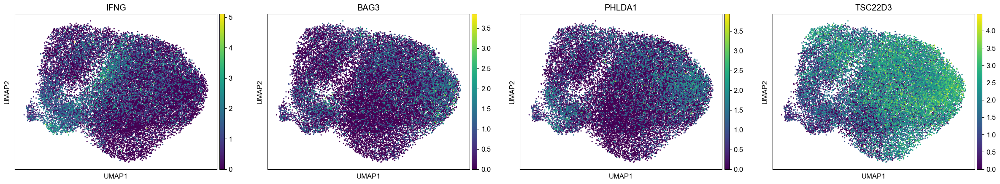

In [604]:
sc.pl.umap(adata_CD8T, color=['IFNG', 'BAG3', 'PHLDA1', 'TSC22D3'], use_raw=False, size=20)

In [ ]:
import gseapy as gp
from gseapy import Msigdb
msig = Msigdb()
# mouse hallmark gene sets
gmt = msig.get_gmt(category='mh.all', dbver="2023.2.Hs")
gmt

In [ ]:
def prep_enrichr(adata, groupby):
  # de analysis
  sc.tl.rank_genes_groups(adata, groupby=groupby)
  sc.tl.dendrogram(adata, groupby=groupby)
  # get deg result
  result = adata.uns['rank_genes_groups']
  groups = result['names'].dtype.names
  degs = pd.DataFrame(
      {group + '_' + key: result[key][group]
      for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
  return degs

def run_enrichr_genelist(genelist):
  kegg = gp.enrichr(genelist,
                  gene_sets='KEGG_2021_Human',
                  outdir=None)
  cc = gp.enrichr(genelist,
                      gene_sets='GO_Cellular_Component_2023',
                      outdir=None)
  hm = gp.enrichr(genelist,
                      gene_sets=['MSigDB_Hallmark_2020'],
                      outdir=None)
  mf = gp.enrichr(genelist,
                      gene_sets='GO_Molecular_Function_2023',
                      outdir=None)
  bp = gp.enrichr(genelist,
                      gene_sets=['GO_Biological_Process_2023'],
                      outdir=None)
  return kegg, cc, hm, mf, bp

def run_enrichr_scanpy(degs, group,direction='up', top_term=15, all_term=False, plot=True):
  # subset up or down regulated genes
  degs_sig = degs[degs[f'{group}_pvals_adj'] < 0.05]
  degs_up = degs_sig[degs_sig[f'{group}_logfoldchanges'] > 0]
  degs_dw = degs_sig[degs_sig[f'{group}_logfoldchanges'] < 0]
  degs_used = degs_up[f'{group}_names'] if direction == 'up' else degs_dw[f'{group}_names']
  kegg, cc, hm, mf, bp = run_enrichr_genelist(degs_used)
  go_res = pd.concat([kegg.res2d.head(top_term),
                    hm.res2d.head(top_term), 
                    cc.res2d.head(top_term), 
                    bp.res2d.head(top_term), 
                    mf.res2d.head(top_term)])
  if plot:
    ax = gp.barplot(go_res, figsize=(6,20),
                group ='Gene_set',
                top_term=top_term,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms")
  else:
    ax = None
  if all_term:
    go_res = pd.concat([kegg.res2d, hm.res2d, cc.res2d, bp.res2d, mf.res2d])
  return go_res, ax
  
def run_enrichr_memento(memento_results,direction='up', top_term=15):
  memento_sig = memento_results[memento_results['de_pval'] < 0.05]
  memento_up = memento_sig[memento_sig['de_coef'] > 0]
  memento_dw = memento_sig[memento_sig['de_coef'] < 0]
  degs_used = memento_up['gene'] if direction == 'up' else memento_dw['gene']
  kegg, cc, hm, mf, bp = run_enrichr_genelist(degs_used)
  go_res = pd.concat([kegg.res2d.head(15),
                      hm.res2d.head(15), 
                      cc.res2d.head(15), 
                      bp.res2d.head(15), 
                      mf.res2d.head(15)])
  ax = gp.barplot(go_res, figsize=(6,20),
              group ='Gene_set',
              top_term=top_term,
              color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
              title ="The Most Enriched Terms")
  return go_res, ax

In [ ]:
degs = prep_enrichr(adata_CD8T, groupby='anno-CD8T')

In [ ]:
degs

,C01_Trm_XCL1_names,C01_Trm_XCL1_scores,C01_Trm_XCL1_pvals,C01_Trm_XCL1_pvals_adj,C01_Trm_XCL1_logfoldchanges,C02_Trm_IL7R_names,C02_Trm_IL7R_scores,C02_Trm_IL7R_pvals,C02_Trm_IL7R_pvals_adj,C02_Trm_IL7R_logfoldchanges,...,C09_tTex_CD200_names,C09_tTex_CD200_scores,C09_tTex_CD200_pvals,C09_tTex_CD200_pvals_adj,C09_tTex_CD200_logfoldchanges,C10_Tprolif_MKI67_names,C10_Tprolif_MKI67_scores,C10_Tprolif_MKI67_pvals,C10_Tprolif_MKI67_pvals_adj,C10_Tprolif_MKI67_logfoldchanges
0,CXCR4,20.621204,1.698907e-91,1.181675e-87,3.106556,TPT1,10.873878,2.122396e-27,4.428697e-23,1.744461,...,GZMA,13.507743,7.616657e-40,1.271464e-36,1.969714,IFITM1,9.716143,5.598318e-19,1.811121e-17,5.859045
1,ZFP36L2,17.921017,4.653634e-70,9.248100e-67,2.459102,CXCR4,10.872049,2.110255e-27,4.428697e-23,1.375939,...,NKG7,13.379120,3.631723e-39,5.613434e-36,3.397095,HLA-H,9.297405,1.063631e-17,3.119362e-16,2.206879
2,BTG1,16.783596,7.522080e-62,9.232910e-59,3.024721,EIF1,10.766472,6.580763e-27,9.154499e-23,0.952724,...,SH3BGRL3,13.164239,4.673862e-38,6.501809e-35,2.566638,ENSG00000213058,8.247341,1.187598e-14,2.744297e-13,2.261630
3,HSP90AA1,16.217319,6.742553e-58,6.863097e-55,6.463179,DDX5,10.102802,6.717963e-24,7.009019e-20,0.616868,...,CD3D,13.093342,1.156072e-37,1.507699e-34,1.277457,LAG3,7.789453,2.201833e-13,4.504368e-12,2.748273
4,PFKFB3,13.479949,8.595729e-41,4.321995e-38,1.017919,NR4A2,9.737670,2.547435e-22,1.771868e-18,0.796906,...,PTMS,13.043217,2.239358e-37,2.831973e-34,1.485220,DNAJB1,7.546316,9.805657e-13,1.895412e-11,7.851515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41728,ISG15,-20.824108,3.128609e-94,2.611325e-90,-1.651237,MGP,-8.611718,7.981007e-18,1.665357e-14,-0.622909,...,NR4A2,-20.483791,3.303130e-86,2.756991e-82,-2.261907,DCN,-28.786102,1.497807e-179,1.250160e-175,-25.374052
41729,IFI44L,-21.397072,2.011372e-99,2.098515e-95,-1.385197,CD63,-8.614914,7.716174e-18,1.665357e-14,-0.418021,...,TSC22D3,-23.136740,6.208124e-108,6.477091e-104,-2.360713,DTD1,-29.378004,8.216071e-187,8.572032e-183,-24.979469
41730,IFITM1,-21.896891,1.256635e-103,1.748105e-99,-2.352953,CXCL13,-8.618878,7.307900e-18,1.665357e-14,-1.383753,...,IL7R,-24.137062,9.276926e-117,1.290513e-112,-2.325773,VKORC1,-30.879295,7.572309e-206,1.053384e-201,-25.210258
41731,LY6E,-23.208593,6.835320e-116,1.426292e-111,-1.433723,PDLIM4,-8.696238,3.645555e-18,9.508746e-15,-1.614589,...,CXCR4,-25.489605,1.004296e-126,2.095614e-122,-4.463919,ENC1,-33.386364,1.351400e-239,2.819900e-235,-26.013115


In [ ]:
gores_list = []
cell_types = adata_CD8T.obs['anno-CD8T'].cat.categories
for ct in cell_types:
  print("Running enrichment for {}...".format(ct))
  go_res, _ = run_enrichr_scanpy(degs, ct,direction='up', top_term=15, all_term=True, plot=False)
  go_res = go_res =  go_res[['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value', 'Odds Ratio', 'Combined Score']]
  go_res['anno'] = ct
  gores_list.append(go_res)
gores = pd.concat(gores_list, axis=0, ignore_index=True)
gores

Running enrichment for C01_Trm_XCL1...
Running enrichment for C02_Trm_IL7R...
Running enrichment for C03_Trm_ISG15...
Running enrichment for C04_Teff_IFNG...
Running enrichment for C05_Teff_GZMK...
Running enrichment for C06_NK_NCAM1...
Running enrichment for C07_NKT_FGFBP2...
Running enrichment for C08_cTex_ENTPD1...
Running enrichment for C09_tTex_CD200...
Running enrichment for C10_Tprolif_MKI67...


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,anno
0,KEGG_2021_Human,Colorectal cancer,10/86,0.000014,0.001146,6.182308,69.020491,C01_Trm_XCL1
1,KEGG_2021_Human,Protein processing in endoplasmic reticulum,14/171,0.000018,0.001146,4.212996,45.990236,C01_Trm_XCL1
2,KEGG_2021_Human,MAPK signaling pathway,19/294,0.000019,0.001146,3.284371,35.714303,C01_Trm_XCL1
3,KEGG_2021_Human,Spliceosome,13/150,0.000020,0.001146,4.476897,48.504737,C01_Trm_XCL1
4,KEGG_2021_Human,FoxO signaling pathway,12/131,0.000024,0.001146,4.750483,50.615087,C01_Trm_XCL1
...,...,...,...,...,...,...,...,...
31452,GO_Molecular_Function_2023,Metallopeptidase Activity (GO:0008237),1/124,0.984708,0.992796,0.236709,0.003648,C10_Tprolif_MKI67
31453,GO_Molecular_Function_2023,G Protein-Coupled Receptor Activity (GO:0004930),3/250,0.990020,0.996106,0.352411,0.003535,C10_Tprolif_MKI67
31454,GO_Molecular_Function_2023,Cis-Regulatory Region Sequence-Specific DNA Bi...,20/1098,0.999173,0.999829,0.528540,0.000437,C10_Tprolif_MKI67
31455,GO_Molecular_Function_2023,RNA Polymerase II Cis-Regulatory Region Sequen...,19/1122,0.999747,0.999829,0.489297,0.000124,C10_Tprolif_MKI67


In [ ]:
prefer_pathway = ['TNF-alpha Signaling via NF-kB', 'Apoptosis', 'Hypoxia', 'p53 Pathway',
                  'IL-2/STAT5 Signaling', 'Estrogen Response Early', 'Estrogen Response Late',
                  'TGF-beta Signaling', 'T cell receptor signaling pathway', 'MAPK signaling pathway',
                  'IL-17 signaling pathway', 'Inflammatory Response', 'Myc Targets V1',
                  'Interferon Gamma Response', 'Interferon Alpha Response', 'Allograft Rejection',
                  'Oxidative Phosphorylation', 'Antigen processing and presentation',
                  'G2-M Checkpoint', 'E2F Targets', 'PI3K/AKT/mTOR  Signaling']

In [ ]:
gores_prefer = gores[gores['Term'].isin(prefer_pathway)]
gores_prefer = gores_prefer.sort_values(by=['Gene_set', 'Term', 'anno'])
gores_prefer = gores_prefer.reset_index(drop=True)
gores_prefer

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,anno
0,KEGG_2021_Human,Antigen processing and presentation,7/78,1.344445e-03,0.013613,4.600310,30.416211,C01_Trm_XCL1
1,KEGG_2021_Human,Antigen processing and presentation,6/78,4.832121e-03,0.024062,4.109007,21.911154,C02_Trm_IL7R
2,KEGG_2021_Human,Antigen processing and presentation,31/78,5.248898e-07,0.000006,3.439004,49.728264,C03_Trm_ISG15
3,KEGG_2021_Human,Antigen processing and presentation,1/78,3.897630e-01,0.566928,2.056831,1.937980,C04_Teff_IFNG
4,KEGG_2021_Human,Antigen processing and presentation,3/78,7.429090e-03,0.044221,8.009293,39.264372,C06_NK_NCAM1
...,...,...,...,...,...,...,...,...
183,MSigDB_Hallmark_2020,p53 Pathway,3/200,8.261501e-02,0.159722,3.030457,7.556638,C06_NK_NCAM1
184,MSigDB_Hallmark_2020,p53 Pathway,1/200,2.678683e-01,0.267868,3.311558,4.362182,C07_NKT_FGFBP2
185,MSigDB_Hallmark_2020,p53 Pathway,18/200,7.051029e-03,0.020738,2.004474,9.931328,C08_cTex_ENTPD1
186,MSigDB_Hallmark_2020,p53 Pathway,28/200,3.164418e-02,0.062782,1.517739,5.241058,C09_tTex_CD200


In [ ]:
import os,sys
import PyComplexHeatmap as pch
print(pch.__version__)

1.8.1


In [ ]:
ct_df = gores_prefer[['Gene_set','Term', 'anno']].copy()

In [ ]:
p_heatmap = gores_prefer[['Adjusted P-value','Term', 'anno']].pivot_table(index='Term', columns='anno', values='Adjusted P-value')
p_heatmap = p_heatmap.fillna(1)
p_heatmap = -np.log10(p_heatmap)

In [ ]:
odd_heatmap = gores_prefer[['Combined Score','Term', 'anno']].pivot_table(index='Term', columns='anno', values='Combined Score')
odd_heatmap = odd_heatmap.fillna(1)

In [ ]:
ct_df = pd.DataFrame(data=p_heatmap.columns, columns=['anno'])

/tmp/ipykernel_1912653/3320474400.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10'],rotation=90, fontsize=11)
/tmp/ipykernel_1912653/3320474400.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(),rotation=0, fontsize=9)


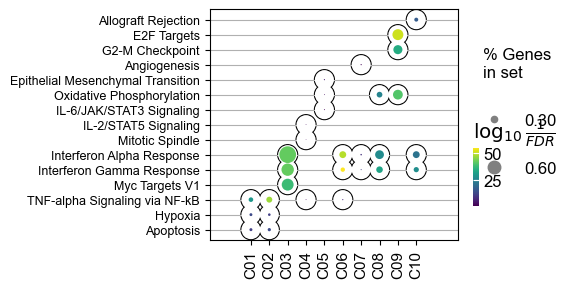

In [ ]:
from gseapy.scipalette import SciPalette
sci = SciPalette()
NbDr = sci.create_colormap() 
ax = gp.dotplot(gores[gores['Gene_set'].isin(['MSigDB_Hallmark_2020'])],figsize=(4,3),
                x='anno',
                title="",
                size=2.5,
                cmap='viridis',
                top_term=3,
                show_ring=True)
ax.set_xticklabels(['C01', 'C02', 'C03', 'C04', 'C05', 'C06', 'C07', 'C08', 'C09', 'C10'],rotation=90, fontsize=11)
ax.set_yticklabels(ax.get_yticklabels(),rotation=0, fontsize=9)
ax.set_xlabel('')
ax.figure.savefig(f"{figPath}/MSigDB_Hallmark_2020.svg", bbox_inches='tight')

In [ ]:
go_tex, ax_tex = run_enrichr_memento(memento_results)

In [ ]:
go_notex, ax_notex = run_enrichr_memento(memento_results, direction='dw')

In [ ]:
res_tex = gp.gsea(data=adata_Tex.to_df().T, # row -> genes, column-> samples
        gene_sets='MSigDB_Hallmark_2020',
        cls=adata_Tex.obs['PD-1_high'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)

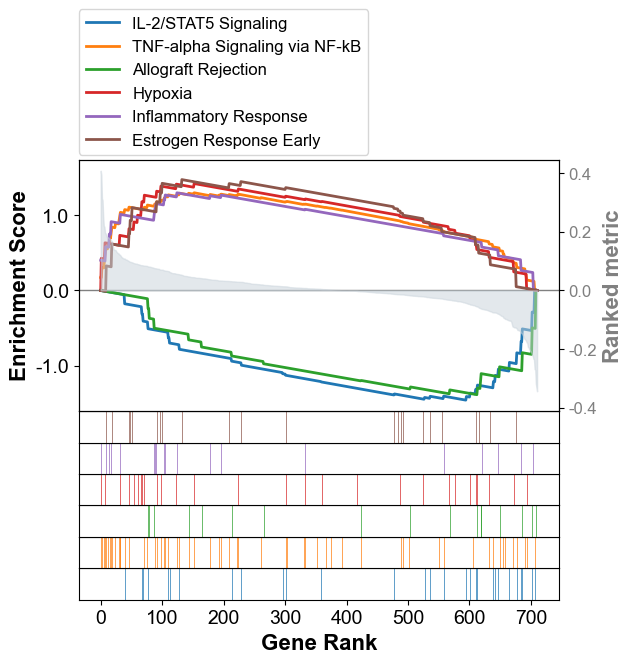

In [ ]:
term = res_tex.res2d.Term
axs = res_tex.plot(terms=term[:6])

In [ ]:
go_tTex, ax_tTex = run_enrichr_memento(DE_tex, direction='up')

In [ ]:
go_cTex, ax_cTex = run_enrichr_memento(DE_tex, direction='dw')

In [ ]:
adata_tTex = adata_CD8T[adata_CD8T.obs['anno-CD8T'].isin(['C08_cTex_ENTPD1',
       'C09_tTex_CD200'])].copy()
adata_tTex.obs['CD200_high'] = adata_tTex.obs['anno-CD8T'].isin(['C09_tTex_CD200'])
adata_tTex.obs['CD200_high'] = adata_tTex.obs['CD200_high'].astype('int')

In [ ]:
res_tTex = gp.gsea(data=adata_tTex.to_df().T, # row -> genes, column-> samples
        gene_sets='MSigDB_Hallmark_2020',
        cls=adata_tTex.obs['CD200_high'],
        permutation_num=1000,
        permutation_type='phenotype',
        outdir=None,
        method='s2n', # signal_to_noise
        threads= 16)

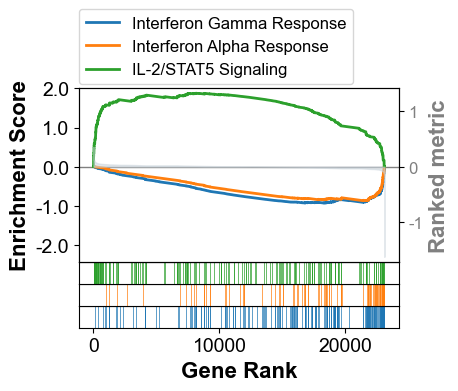

In [ ]:
term_tTex = res_tTex.res2d.Term
axs_tTex = res_tTex.plot(terms=term_tTex[:3])
axs_tTex.set_size_inches(4,3)
axs_tTex.savefig(f"{figPath}/tTex_GSEA.svg", bbox_inches='tight')

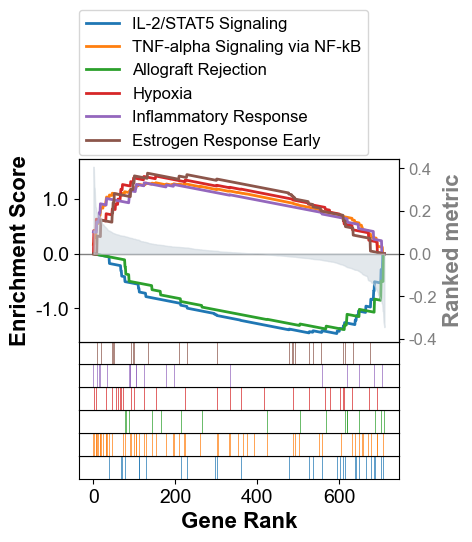

In [ ]:
term_Tex = res_tex.res2d.Term
axs_Tex = res_tex.plot(terms=term_Tex[:6])
axs_Tex.set_size_inches(4,4)
axs_Tex.savefig(f"{figPath}/Tex_GSEA.svg", bbox_inches='tight')

In [907]:
adata = sc.read_h5ad("adata-preF.h5ad")
adata

AnnData object with n_obs × n_vars = 178891 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'molecular_type_colors', 'neigh

In [908]:
# adata.obs['majorType-fix'].cat.categories
annoDict = {
  'Non-tumoral': ['5N', '6N', '10N', '12N', '16N'],
  'TNBC': ['1T', '2T', '3T', '8T', '9T',],
  'HR+HER2-': ['5T', '6T', '10T', '15T', ],
  'HR+HER2+': ['20T', '21T', '22T',],
  'HR-HER2+': ['17T', ],
}
adata = anno(adata, annoDict, 'IHC', 'batch')
adata_B = adata[adata.obs['majorType-fix'].isin(['B cells'])]
adata_B

View of AnnData object with n_obs × n_vars = 3905 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'IHC'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'neighbors', 'pca'

In [909]:
adata_bcr = adata_ir[adata_ir.obs['receptor_type'] == 'BCR']

In [910]:
ir.pp.index_chains(adata_bcr)
ir.tl.chain_qc(adata_bcr)

/home/rzh/BCY/lib/python3.10/site-packages/scirpy/pp/_index_chains.py:142: ImplicitModificationWarning: Setting element `.obsm['chain_indices']` of view, initializing view as actual.
  params.adata.obsm[key_added] = ak.zip(res, depth_limit=1)  # type: ignore


In [912]:
def clu(adata, key_added="majorType-fix", 
        n_neighbors=50, n_pcs=30, 
        rep='X_pca_harmony', 
        do_har=False, 
        max_iter=20, 
        do_scrublet=False, 
        har_key='batch', 
        resolution=1):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    sc.pp.highly_variable_genes(adata, n_top_genes=2000)
    sc.pp.pca(adata, svd_solver='arpack', use_highly_variable=True)
    if do_har and len(adata.obs[har_key].cat.categories) > 1:
        sc.external.pp.harmony_integrate(adata, key=har_key,max_iter_harmony=max_iter)
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    else:
        print("Evaluating neighbors only...")
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=resolution, key_added=key_added)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

Ignoring processing doublet cells...


2025-03-14 14:56:06,306 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-14 14:56:09,479 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-14 14:56:09,496 - harmonypy - INFO - Iteration 1 of 20
2025-03-14 14:56:10,112 - harmonypy - INFO - Iteration 2 of 20
2025-03-14 14:56:10,731 - harmonypy - INFO - Converged after 2 iterations
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


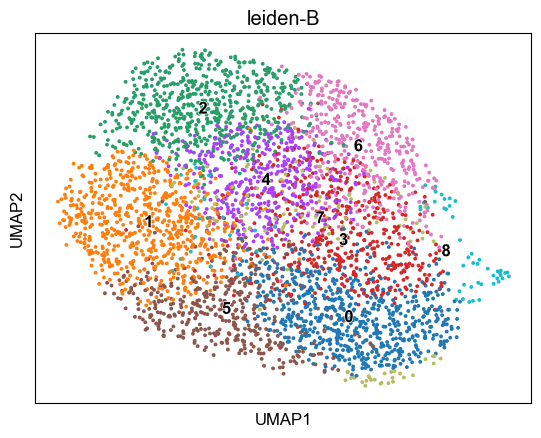

In [921]:
adata_B.obs['tech'] = '5'
adata_B.obs.loc[adata_B.obs['batch'].isin(['1T', '2T', '3T']), 'tech'] = '3'
adata_B.obs['tech'] = adata_B.obs['tech'].astype('category')
adata_B = clu(adata_B, 'leiden-B', n_pcs=40, har_key='tech', do_har=True, resolution=1)

In [923]:
sc.tl.leiden(adata_B, resolution=1.5, key_added='1.5')
sc.tl.leiden(adata_B, resolution=1.7, key_added='1.7')
sc.tl.leiden(adata_B, resolution=1.8, key_added='1.8')
sc.tl.leiden(adata_B, resolution=2.0, key_added='2.0')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


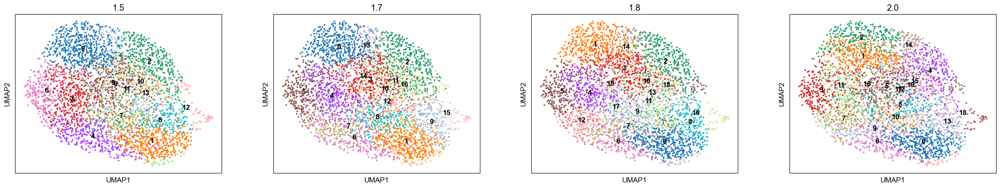

In [925]:
sc.pl.umap(adata_B, color=['1.5', '1.7', '1.8', '2.0'], legend_loc='on data')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


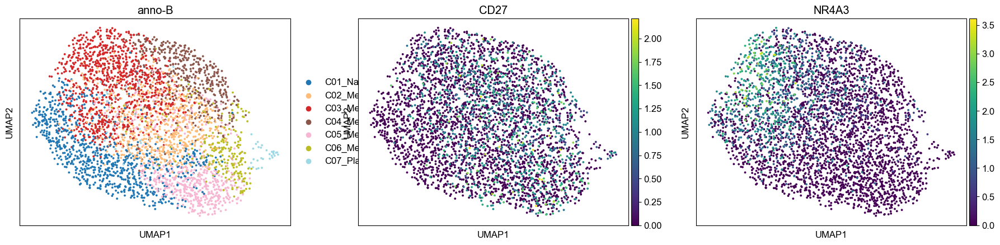

In [1070]:
annoDict = {
  'C01_Naive_IGHD': ['5', '12', '6','7'],
  "C03_Mem_NR4A3": ['1', '3', '4'],
  "C04_Mem_DNAJB1": ['2', '14'],
  "C05_Mem_IGKC": ['0', '13'],
  "C06_Mem_LY6E": ['8','18'],
  'C07_Plasma_CD38': ['16'],

}
adata_B = anno(adata_B, annoDict, 'anno-B', '1.8', default='C02_Mem_CD27')
sc.pl.umap(adata_B, color=['anno-B', 'CD27', 'NR4A3'])

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


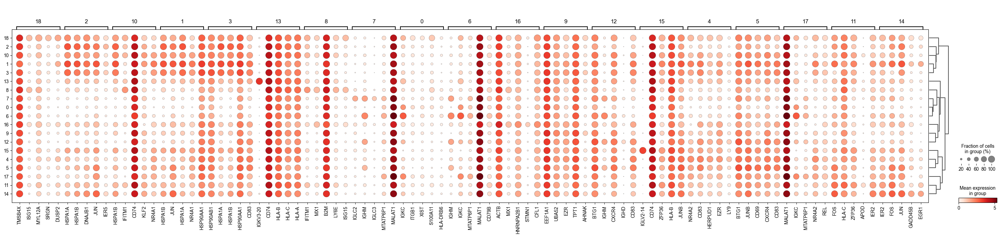

In [961]:
sc.tl.rank_genes_groups(adata_B, groupby='1.8')
sc.tl.dendrogram(adata_B, groupby='1.8')
sc.pl.rank_genes_groups_dotplot(adata_B, groupby='1.8', n_genes=5)

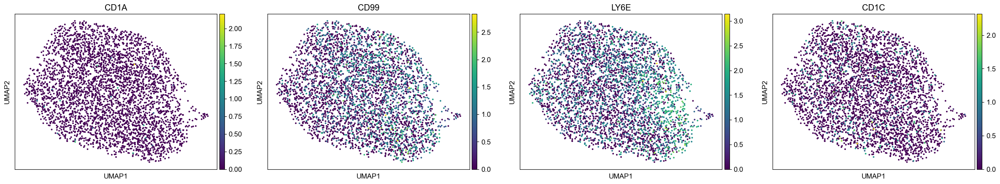

In [972]:
sc.pl.umap(adata_B, color=['CD1A', 'CD99', 'LY6E',  'CD1C'])

In [1099]:
mdata_B = mu.MuData({'airr': adata_bcr, 'gex': adata_B})

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


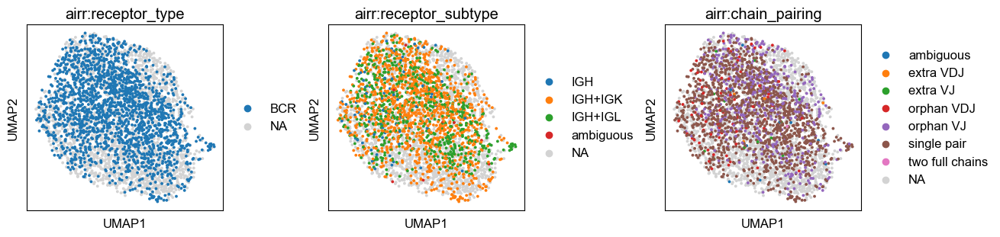

In [1100]:
# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_B, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-umap-tbcr.png", dpi=300, bbox_inches='tight')

  0%|          | 0/5462 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


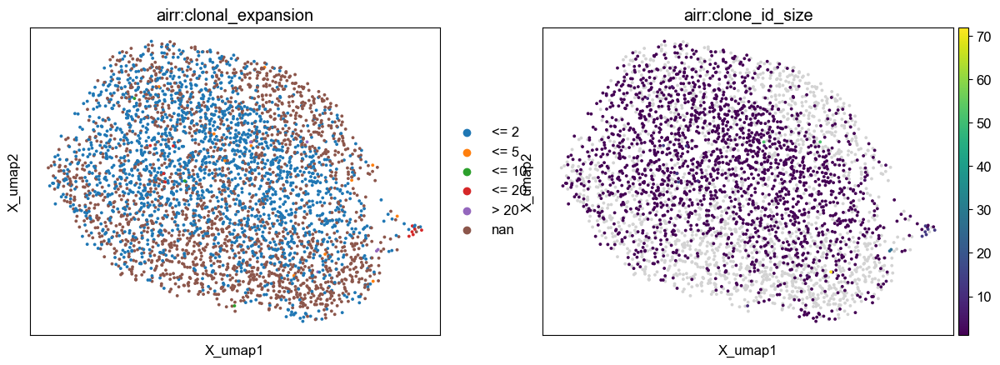

In [1101]:
ir.pp.ir_dist(mdata_B, metric="identity", sequence="nt", key_added="ir_dist_nt_identity", n_jobs=16)
ir.tl.define_clonotypes(mdata_B, key_added="clone_id", same_v_gene=False, dual_ir='primary_only',receptor_arms="all" )
ir.tl.clonal_expansion(mdata_B, target_col="clone_id", key_added="clonal_expansion", breakpoints=[2,5,10,20])
mu.pl.embedding(mdata_B, basis='gex:umap',color=['airr:clonal_expansion', 'airr:clone_id_size'])

In [1102]:
mdata_B.obs['gex:clonal_size'] = mdata_B.obs['airr:clonal_expansion']
adata_B.obs['clonal_size'] = mdata_B.obs['airr:clonal_expansion']
annot = {
  50: ['<= 40','> 40'],
  40: ['<= 20'],
  30: ['<= 10'],
  20: ['<= 5'],
  10: ['<= 2'],
}
adata_B = anno(adata_B, annot, 'spot_size', 'clonal_size', 3)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


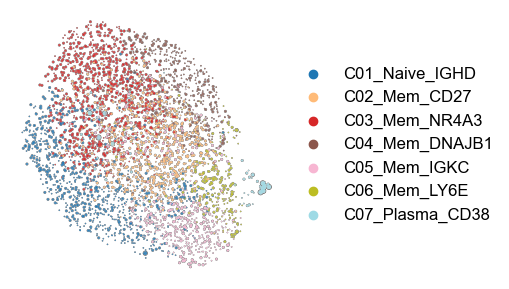

In [1072]:
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3.5))
sc.pl.umap(adata_B,color=['anno-B'], 
           size=adata_B.obs['spot_size'], 
           alpha=0.8, add_outline=True, 
           palette='tab20',
           outline_color=('#5c5a5a','lightgrey'),
           outline_width=(0.15,0.02),
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-anno_B_clonal.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


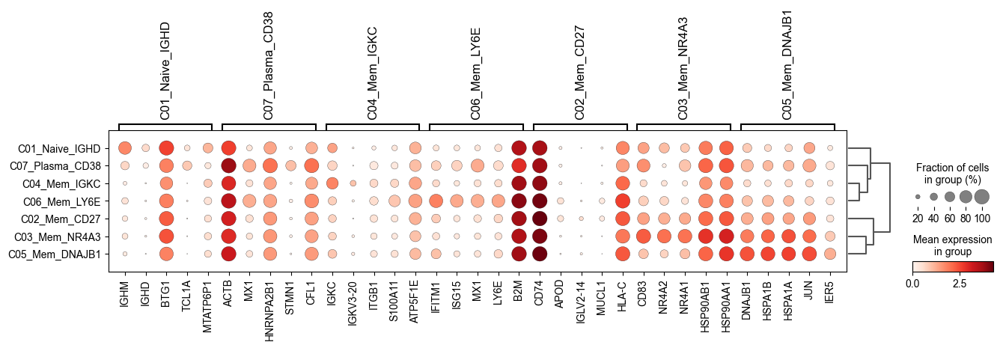

In [997]:
sc.tl.rank_genes_groups(adata_B, groupby='anno-B')
sc.tl.dendrogram(adata_B, groupby='anno-B')
sc.pl.rank_genes_groups_dotplot(adata_B, groupby='anno-B', n_genes=5, save='B-3.16.svg')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


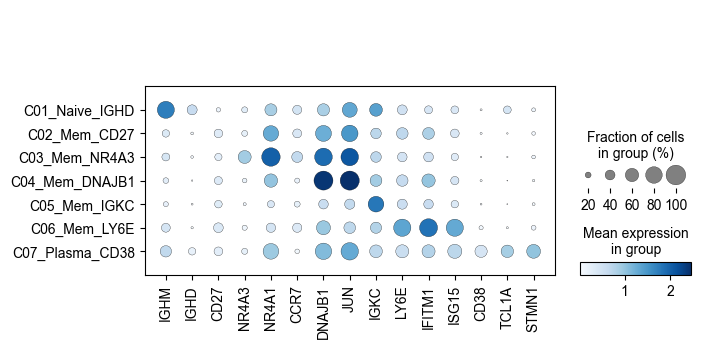

In [1074]:
sc.pl.dotplot(adata_B, 
              var_names=['IGHM', 'IGHD','CD27', 'NR4A3', 'NR4A1', 'CCR7', 'DNAJB1', 'JUN', 'IGKC','LY6E',
                        'IFITM1', 'ISG15', 'CD38','TCL1A', 'STMN1',], 
              groupby='anno-B', cmap='Blues', save='B-3.16.svg')

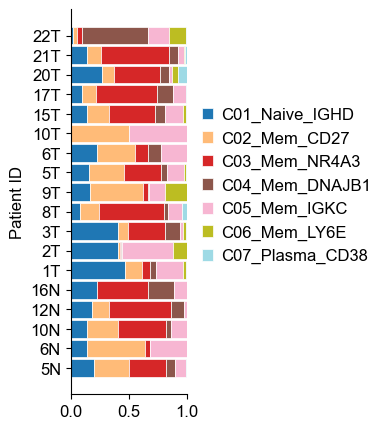

In [1075]:
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','17T','20T', '21T', '22T']
cell_types = list(adata_B.obs['anno-B'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
colors=['#1f77b4', '#ffbb78', '#d62728', '#8c564b', '#f7b6d2', '#bcbd22', '#9edae5']
for bar in barlabels:
    d1 = pd.DataFrame([len(adata_B[(adata_B.obs["anno-B"] == ct) & (adata_B.obs["batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
fig0, ax0 = plt.subplots(figsize=(1.5, 5))
propPlot(age_df, ax=ax0, barlabels=barlabels, show_label=False, colors=colors)
fig0.savefig(f"{figPath}/B_batch_proportions.svg",bbox_inches='tight')

### Run MiloR for normal and molecular types

In [ ]:
conDict = {
  'others': ['Non-tumoral',],
  'Normal': ['TNBC', 'HR+HER2-', 'HR-HER2+','HR+HER2+']
}
adata_no_knn, knn_adjacency, design_df = prepare_miloR(adata_B, conDict, 'TorN', 'IHC')

Index(['Normal', 'others'], dtype='object')


/tmp/ipykernel_1912653/3671355112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df.drop_duplicates(inplace=True)


In [1079]:
%%R -i adata_no_knn
library(ggplot2)
library(ggbeeswarm)
library(colorspace)
milo <- Milo(adata_no_knn)

/usr/lib/python3.10/functools.py:889: NotConvertedWarning: Conversion 'py2rpy' not defined for objects of type '<class 'NoneType'>'
  return dispatch(args[0].__class__)(*args, **kw)


In [1080]:
%%R -i knn_adjacency
milo_graph <- buildFromAdjacency(knn_adjacency, k=20, is.binary=TRUE)
graph(milo) <- miloR::graph(milo_graph)

milo <- buildGraph(milo, k=20, d=30)

## Define neighbourhoods
milo <- makeNhoods(milo, prop = 0.1, k = 20, d=30, refined = TRUE)
## Count cells in neighbourhoods
milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="batch")

## Calculate distances between cells in neighbourhoods
## for spatial FDR correction
milo <- calcNhoodDistance(milo, d=30)

Constructing kNN graph with k:20
Checking valid object
Running refined sampling with reduced_dim
Checking meta.data validity
Counting cells in neighbourhoods


In [1089]:
conDict = {
  'Normal': ['Non-tumoral','TNBC','HR-HER2+', 'HR+HER2-'],
  'Tumor': ['HR+HER2+',]
}
adata_no_knn, knn_adjacency, design_df = prepare_miloR(adata_B, conDict, 'TorN', 'IHC')

Index(['Normal', 'Tumor'], dtype='object')


/tmp/ipykernel_1912653/3671355112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df.drop_duplicates(inplace=True)


In [1090]:
%%R -i design_df -o DA_results

## Test for differential abundance
DA_results <- testNhoods(milo, design = ~ TorN, design.df = design_df)

## Annotate differential abundance
milo <- buildNhoodGraph(milo)
DA_results <- annotateNhoods(milo, DA_results, coldata_col = "anno.B")

Using TMM normalisation
Performing spatial FDR correction withk-distance weighting
In addition: Warning message:
In testNhoods(milo, design = ~TorN, design.df = design_df) :
  Sample names in design matrix and nhood counts are not matched. Reordering


In [1091]:
%%R 
DA_results <- DA_results[order(DA_results[['anno.B']], decreasing=T), ]
p <- ggplot(DA_results, aes(x = logFC, y = anno.B)) +
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR > 0.1,], alpha=0.5, colour='grey50', size=1) + 
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR <= 0.1,], aes(colour=logFC, alpha=abs(logFC)), size=1.5) + 
  geom_violin(color = "#44403f", alpha=0) +
  theme_bw() +
  scale_colour_gradient2(low=darken('blue'), mid='grey80', high=darken('#ff0000'), midpoint=0) +
  labs(x="Log Fold Change", y="B subtypes") +
  theme(axis.text.y=element_text(size=12,colour='black'), axis.title.y=element_text(size=14),
        axis.text.x=element_text(size=12,colour='black'), axis.title.x=element_text(size=14),
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank()) +
  stat_summary(aes(label = sprintf("%.2f",..x..)),
        fun = mean, geom = "text") +
  guides(colour=FALSE, alpha=FALSE)
ggsave("~/figure-1.23/DA_B_HR+HER2+.pdf", p, width = 4, height = 3.5, units = "in")

Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`
Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`


In [1092]:
ir.tl.clonotype_network(mdata_B)

In [1219]:
batches = mdata_B.obs["gex:batch"].cat.categories
cloneCounts = {}
for ct in list(batches):
  _mdata = mdata_B[mdata_B.obs["gex:batch"] == ct]
  expanded_clonotypes = _mdata.obs[_mdata.obs["airr:clone_id_size"] > 1]["airr:clone_id"]
  clonotype_counts = pd.Series(expanded_clonotypes.value_counts())
  cloneCounts[ct] = clonotype_counts
del cloneCounts['1T'], cloneCounts['2T'], cloneCounts['3T']
mdata_B.obs['airr:cells_with_BCRs'] = mdata_B.obs['airr:clone_id_size'] > 0
bcr = mdata_B.obs[['gex:batch','airr:cells_with_BCRs']]
bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]
bcr = bcr.dropna()
bcr_df = ir.tl.summarize_clonal_expansion(mdata_B, groupby='gex:batch', normalize=False, summarize_by='cell')
bcr_df['clonally_expanded'] = bcr_df['<= 2'] + bcr_df['> 2']
bcr_df['B cells with BCRs'] = bcr_df['<= 1']
bcr_df['Top 5 expanded'] = [cloneCounts[x].nlargest(5).sum() for x in bcr_df.index]
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','17T','20T', '21T', '22T']
barlabels.reverse()
cell_types = list(bcr['cells_with_BCRs'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(bcr.loc[(bcr['cells_with_BCRs'] == ct) & (bcr["gex:batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
age_df = pd.concat([age_df, bcr_df[['clonally_expanded', 'B cells with BCRs', 'Top 5 expanded']]], axis=1)
age_df = age_df.fillna(0)
age_df = age_df[['Top 5 expanded', 'clonally_expanded', 'B cells with BCRs', 'without']]
age_df['clonally_expanded'] = age_df['clonally_expanded'] - age_df['Top 5 expanded']
age_df

/tmp/ipykernel_1912653/522365054.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]


,Top 5 expanded,clonally_expanded,B cells with BCRs,without
22T,6.0,0.0,68.0,342
21T,8.0,0.0,202.0,42
20T,13.0,0.0,268.0,148
17T,3.0,0.0,204.0,110
15T,6.0,1.0,286.0,256
10T,0.0,0.0,2.0,0
6T,1.0,0.0,26.0,0
5T,9.0,1.0,105.0,1
9T,7.0,1.0,432.0,27
8T,0.0,0.0,24.0,1


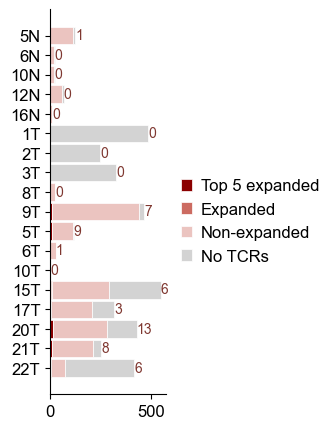

In [1180]:
fig0, ax0 = plt.subplots(figsize=(1.5, 5))
colors=['darkred','#cc6b61', '#ebc4c0', 'lightgrey']
age_df.columns = ['Top 5 expanded','Expanded', 'Non-expanded', 'No TCRs']
countPlot(age_df, ax=ax0, barlabels=barlabels, colors=colors, bar_label='0', xlabel='')
fig0.savefig(f"{figPath}/4h-B-proportions1.svg",bbox_inches='tight')

In [1198]:
adata_B.write_h5ad("adata-B-3.14.h5ad")

In [1199]:
adata_Pla = adata[adata.obs['majorType-fix'].isin(['Plasmablast'])]
adata_Pla

View of AnnData object with n_obs × n_vars = 4656 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'IHC'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_colors', 'minor-type_colors', 'minor_type_colors', 'neighbors', 'pca'

/tmp/ipykernel_1912653/3407296193.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_Pla.obs['tech'] = '5'


Ignoring processing doublet cells...


2025-03-18 09:29:14,828 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-18 09:29:17,151 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-18 09:29:17,314 - harmonypy - INFO - Iteration 1 of 20
2025-03-18 09:29:18,168 - harmonypy - INFO - Iteration 2 of 20
2025-03-18 09:29:18,968 - harmonypy - INFO - Converged after 2 iterations


/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


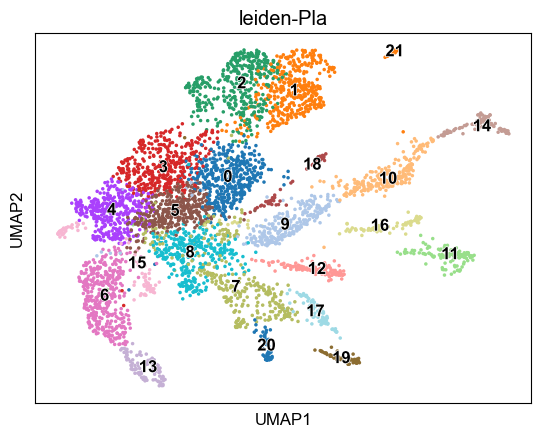

In [1200]:
adata_Pla.obs['tech'] = '5'
adata_Pla.obs.loc[adata_Pla.obs['batch'].isin(['1T', '2T', '3T']), 'tech'] = '3'
adata_Pla.obs['tech'] = adata_Pla.obs['tech'].astype('category')
adata_Pla = clu(adata_Pla, 'leiden-Pla', n_pcs=15, har_key='tech', do_har=True, resolution=1)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:401: PerformanceWarning: DataFrame is highly fragmented.  This is usually t

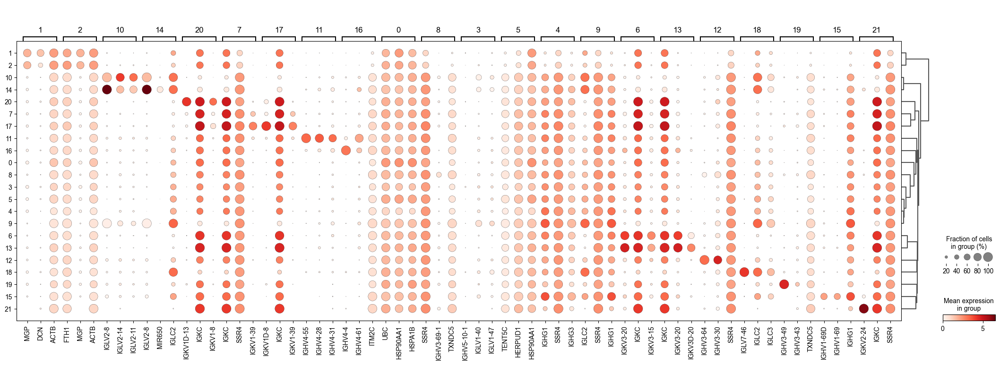

In [1201]:
sc.tl.rank_genes_groups(adata_Pla, groupby='leiden-Pla')
sc.tl.dendrogram(adata_Pla, groupby='leiden-Pla')
sc.pl.rank_genes_groups_dotplot(adata_Pla, groupby='leiden-Pla', n_genes=3)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


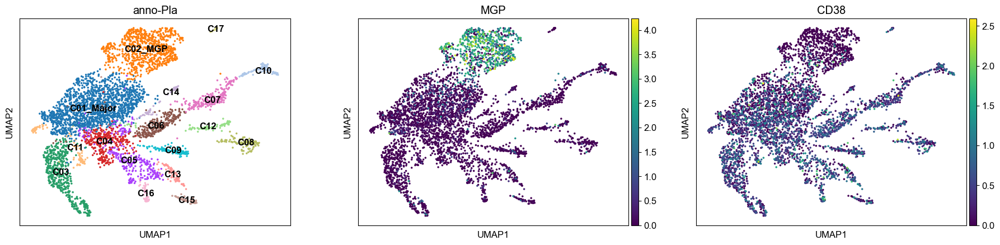

In [1207]:
annoDict = {
  'C01_Major': ['0', '3', '4', '5'],
  "C02_MGP": ['1', '2'],
  "C03": ['6', '13'],
  "C04": ['8'],
  "C05": ['7'],
  "C06": ['9'],
  "C07": ['10'],
  "C08": ['11'],
  "C09": ['12'],
  "C10": ['14'],
  "C11": ['15'],
  "C12": ['16'],
  "C13": ['17'],
  "C14": ['18'],
  "C15": ['19'],
  "C16": ['20'],
  "C17": ['21'],
}
adata_Pla = anno(adata_Pla, annoDict, 'anno-Pla', 'leiden-Pla')
sc.pl.umap(adata_Pla, color=['anno-Pla', 'MGP', 'CD38'], legend_loc='on data')

In [1208]:
mdata_Pla = mu.MuData({'airr': adata_bcr, 'gex': adata_Pla})

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


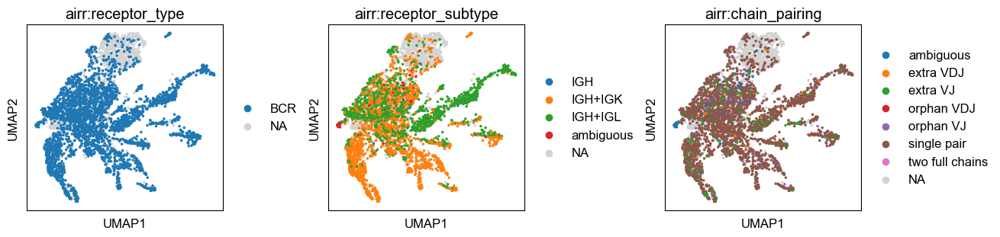

In [1209]:
# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_Pla, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/Pla-umap-tbcr.png", dpi=300, bbox_inches='tight')

  0%|          | 0/5462 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


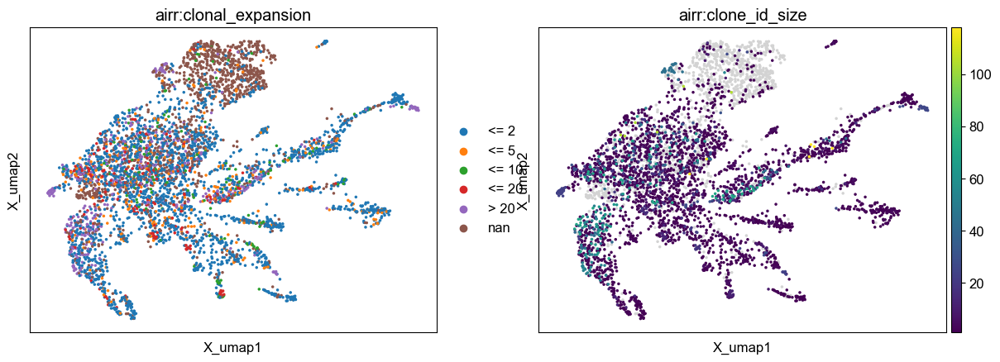

In [1210]:
ir.pp.ir_dist(mdata_Pla, metric="identity", sequence="nt", key_added="ir_dist_nt_identity", n_jobs=16)
ir.tl.define_clonotypes(mdata_Pla, key_added="clone_id", same_v_gene=False, dual_ir='primary_only',receptor_arms="all" )
ir.tl.clonal_expansion(mdata_Pla, target_col="clone_id", key_added="clonal_expansion", breakpoints=[2,5,10,20])
mu.pl.embedding(mdata_Pla, basis='gex:umap',color=['airr:clonal_expansion', 'airr:clone_id_size']) 

In [ ]:
mdata_Pla.obs['gex:clonal_size'] = mdata_Pla.obs['airr:clonal_expansion']
adata_Pla.obs['clonal_size'] = mdata_Pla.obs['airr:clonal_expansion']
annot = {
  50: ['<= 40','> 40'],
  40: ['<= 20'],
  30: ['<= 10'],
  20: ['<= 5'],
  10: ['<= 2'],
}
adata_Pla = anno(adata_Pla, annot, 'spot_size', 'clonal_size', 3)

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


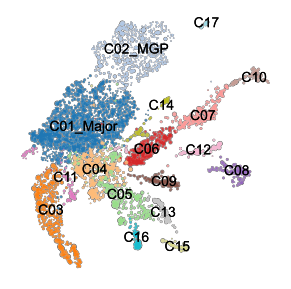

In [1216]:
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3.5))
sc.pl.umap(adata_Pla,color=['anno-Pla'], 
           size=adata_Pla.obs['spot_size'], 
           alpha=0.8, add_outline=True, 
           palette='tab20',
           outline_color=('#5c5a5a','lightgrey'),
           legend_loc='on data',
           legend_fontweight=False,
           legend_fontoutline=False,
           legend_fontsize=10,
           outline_width=(0.15,0.02),
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-anno_Pla_clonal.png', dpi=400, bbox_inches='tight')

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


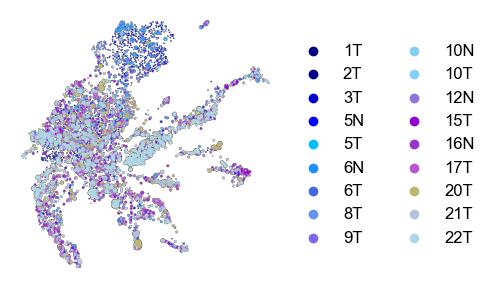

In [1337]:
pastel_palette = [
    "#F5EBFF", "#E5F6FF", "#E5FFF6", "#FFF6CC", "#FFEBEB",
    "#FFD9EC", "#E6F5FF", "#FFF6CC", "#E6FFE6", "#FFF0CC",
    "#FFE6CC", "#FFE6F5", "#E6E6FF", "#F5FFCC", "#CCFFE6",
    "#CCE6FF", "#FFCCE6", "#FFE6CC", "#E6FFCC", "#CCFFF5"
]
cool_palette = [
    "#000080", "#00008B", "#0000CD", "#0000FF", "#00BFFF",
    "#1E90FF", "#4169E1", "#6495ED", "#7B68EE", "#87CEEB",
    "#87CEFA", "#9370DB", "#9400D3", "#9932CC", "#BA55D3",
    "#BDB76B", "#B0C4DE", "#ADD8E6", "#AFEEEE", "#B0E0E6"
]
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3.5))
sc.pl.umap(adata_Pla,color=['batch'], 
           size=adata_Pla.obs['spot_size'], 
           alpha=0.8, add_outline=True, 
           palette=cool_palette,
           outline_color=('#5c5a5a','lightgrey'),
           outline_width=(0.15,0.02),
           title='', ax=ax, show=False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-batch_Pla_clonal.pdf', bbox_inches='tight')

In [1233]:
batches = mdata_Pla.obs["gex:batch"].cat.categories
cloneCounts = {}
for ct in list(batches):
  _mdata = mdata_Pla[mdata_Pla.obs["gex:batch"] == ct]
  expanded_clonotypes = _mdata.obs[_mdata.obs["airr:clone_id_size"] > 1]["airr:clone_id"]
  clonotype_counts = pd.Series(expanded_clonotypes.value_counts())
  cloneCounts[ct] = clonotype_counts
del cloneCounts['1T'], cloneCounts['2T'], cloneCounts['3T']
mdata_Pla.obs['airr:cells_with_BCRs'] = mdata_Pla.obs['airr:clone_id_size'] > 0
bcr = mdata_Pla.obs[['gex:batch','airr:cells_with_BCRs']]
bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]
bcr = bcr.dropna()
bcr_df = ir.tl.summarize_clonal_expansion(mdata_Pla, groupby='gex:batch', normalize=False, summarize_by='cell')
bcr_df['clonally_expanded'] = bcr_df['<= 2'] + bcr_df['> 2']
bcr_df['Plasma cells with BCRs'] = bcr_df['<= 1']
bcr_df['Top 5 expanded'] = [cloneCounts[x].nlargest(5).sum() for x in bcr_df.index]
barlabels = ['5N', '6N', '10N', '12N','16N','1T', '2T', '3T', '8T', '9T', '5T','6T', '10T','15T','17T','20T', '21T', '22T']
barlabels.reverse()
cell_types = list(bcr['cells_with_BCRs'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(bcr.loc[(bcr['cells_with_BCRs'] == ct) & (bcr["gex:batch"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
age_df = pd.concat([age_df, bcr_df[['clonally_expanded', 'Plasma cells with BCRs', 'Top 5 expanded']]], axis=1)
age_df = age_df.fillna(0)
age_df = age_df[['Top 5 expanded', 'clonally_expanded', 'Plasma cells with BCRs', 'without']]
age_df['clonally_expanded'] = age_df['clonally_expanded'] - age_df['Top 5 expanded']
age_df

/tmp/ipykernel_1912653/4244775528.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]


,Top 5 expanded,clonally_expanded,Plasma cells with BCRs,without
22T,199.0,383.0,415.0,169
21T,33.0,30.0,112.0,15
20T,57.0,124.0,214.0,25
17T,85.0,106.0,171.0,33
15T,66.0,96.0,430.0,50
10T,0.0,0.0,0.0,20
6T,33.0,3.0,52.0,5
5T,9.0,3.0,31.0,16
9T,9.0,0.0,21.0,4
8T,17.0,7.0,57.0,5


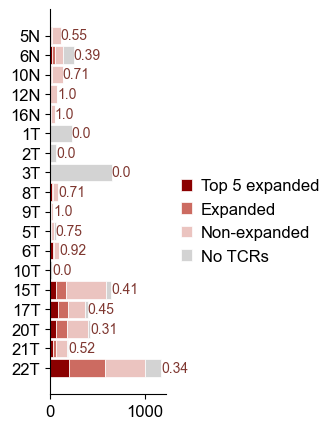

In [1248]:
fig0, ax0 = plt.subplots(figsize=(1.5, 5))
colors=['darkred','#cc6b61', '#ebc4c0', 'lightgrey']
age_df.columns = ['Top 5 expanded','Expanded', 'Non-expanded', 'No TCRs']
countPlot(age_df, ax=ax0, barlabels=barlabels, colors=colors, bar_label='topRate', xlabel='')
fig0.savefig(f"{figPath}/4h-Pla-proportions1.svg",bbox_inches='tight')

In [1254]:
batches = mdata_Pla.obs["gex:anno-Pla"].cat.categories
cloneCounts = {}
for ct in list(batches):
  _mdata = mdata_Pla[mdata_Pla.obs["gex:anno-Pla"] == ct]
  expanded_clonotypes = _mdata.obs[_mdata.obs["airr:clone_id_size"] > 1]["airr:clone_id"]
  clonotype_counts = pd.Series(expanded_clonotypes.value_counts())
  cloneCounts[ct] = clonotype_counts
mdata_Pla.obs['airr:cells_with_BCRs'] = mdata_Pla.obs['airr:clone_id_size'] > 0
bcr = mdata_Pla.obs[['gex:anno-Pla','airr:cells_with_BCRs']]
bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]
bcr = bcr.dropna()
bcr_df = ir.tl.summarize_clonal_expansion(mdata_Pla, groupby='gex:anno-Pla', normalize=False, summarize_by='cell')
bcr_df['clonally_expanded'] = bcr_df['<= 2'] + bcr_df['> 2']
bcr_df['Plasma cells with BCRs'] = bcr_df['<= 1']
bcr_df['Top 5 expanded'] = [cloneCounts[x].nlargest(5).sum() for x in bcr_df.index]
barlabels = list(mdata_Pla.obs["gex:anno-Pla"].cat.categories)
cell_types = list(bcr['cells_with_BCRs'].unique())
cell_types.sort()
age_df = pd.DataFrame(columns = list(cell_types))
for bar in barlabels:
    d1 = pd.DataFrame([len(bcr.loc[(bcr['cells_with_BCRs'] == ct) & (bcr["gex:anno-Pla"] == bar)]) for ct in list(cell_types)], index = list(cell_types), columns=[bar]).T
    age_df = pd.concat([age_df, d1])
age_df = pd.concat([age_df, bcr_df[['clonally_expanded', 'Plasma cells with BCRs', 'Top 5 expanded']]], axis=1)
age_df = age_df.fillna(0)
age_df = age_df[['Top 5 expanded', 'clonally_expanded', 'Plasma cells with BCRs', 'without']]
age_df['clonally_expanded'] = age_df['clonally_expanded'] - age_df['Top 5 expanded']
age_df

/tmp/ipykernel_1912653/1594218152.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bcr['cells_with_BCRs'] = ['with' if x == True else 'without' for x in bcr['airr:cells_with_BCRs']]


,Top 5 expanded,clonally_expanded,Plasma cells with BCRs,without
C01_Major,114,371.0,578.0,470
C02_MGP,32,40.0,78.0,627
C03,113,62.0,230.0,67
C04,35,75.0,159.0,40
C05,32,44.0,191.0,49
C06,63,76.0,82.0,35
C07,21,34.0,141.0,21
C08,16,11.0,85.0,7
C09,14,9.0,79.0,10
C10,35,6.0,49.0,15


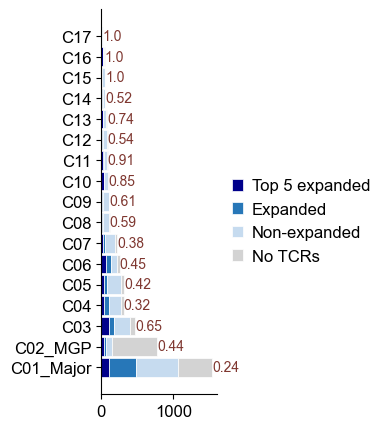

In [1255]:
fig0, ax0 = plt.subplots(figsize=(1.5, 5))
colors=['darkblue','#2777b8', '#c6dbef', 'lightgrey']
age_df.columns = ['Top 5 expanded','Expanded', 'Non-expanded', 'No TCRs']
countPlot(age_df, ax=ax0, barlabels=barlabels, colors=colors, bar_label='topRate', xlabel='')
fig0.savefig(f"{figPath}/4h-Pla-proportions2.svg",bbox_inches='tight')

<AxesSubplot: title={'center': 'Number of cells in airr:clone_id by gex:anno-Pla'}, xlabel='airr:clone_id', ylabel='Number of cells'>

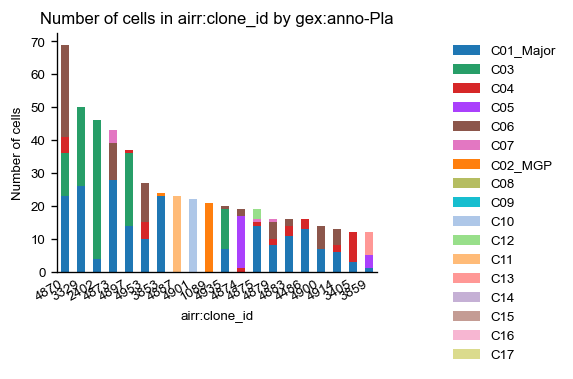

In [1269]:
ir.pl.group_abundance(mdata_Pla, groupby='airr:clone_id', target_col='gex:anno-Pla', max_cols=20)

In [1306]:
clone_counts = mdata_Pla.obs.groupby(['gex:anno-Pla', 'airr:clone_id']).size().reset_index(name='cell_count')
max_clone = clone_counts.groupby('gex:anno-Pla')['cell_count'].idxmax()
result = clone_counts.loc[max_clone, ['gex:anno-Pla', 'airr:clone_id', 'cell_count']]
result['anno-clone'] = [f"{a}:{b}" for a, b in zip(result['gex:anno-Pla'], result['airr:clone_id'])]
result

,gex:anno-Pla,airr:clone_id,cell_count,anno-clone
4873,C01_Major,4873,28,C01_Major:4873
6551,C02_MGP,1089,21,C02_MGP:1089
13326,C03,2402,42,C03:2402
21325,C04,4939,10,C04:4939
26722,C05,4874,16,C05:4874
32180,C06,4870,28,C06:4870
37738,C07,4966,7,C07:4966
40747,C08,2513,4,C08:2513
48174,C09,4478,4,C09:4478
54059,C10,4901,22,C10:4901


In [1335]:
mdata_Pla.obs['gex:anno-Pla'] = list(mdata_Pla.obs['gex:anno-Pla'])
mdata_Pla.obs['airr:clone_id'] = list(mdata_Pla.obs['airr:clone_id'])
mdata_Pla.obs['gex:anno-clone'] = mdata_Pla.obs['gex:anno-Pla']+ ':' + mdata_Pla.obs['airr:clone_id']
mdata_Pla.obs['gex:anno-clone'] = [s if s in list(result['anno-clone']) else np.nan for s in mdata_Pla.obs['gex:anno-clone']]

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


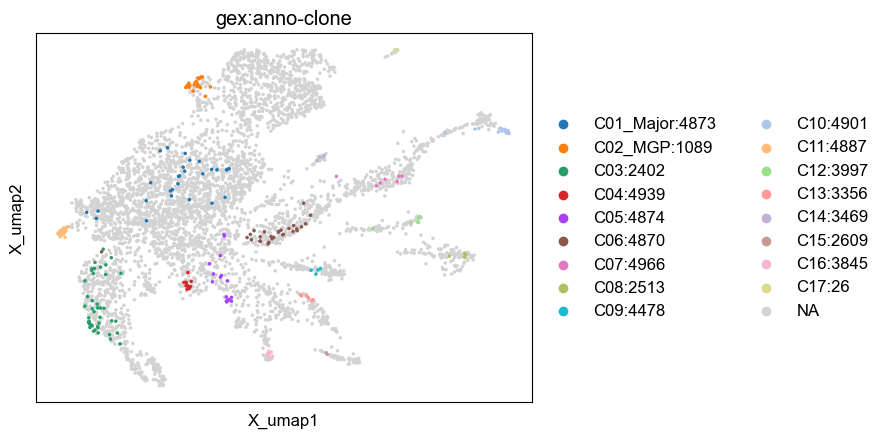

In [1330]:
from cycler import cycler
from matplotlib import cm as mpl_cm
mu.pl.embedding(mdata_Pla, basis='gex:umap', color="gex:anno-clone", groups=list(result['anno-clone']), palette=cycler(color=sc.pl.palettes.default_20))

In [1356]:
mdata_Pla['gex'].obs['anno-clone'] = mdata_Pla.obs['gex:anno-clone']

/home/rzh/BCY/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


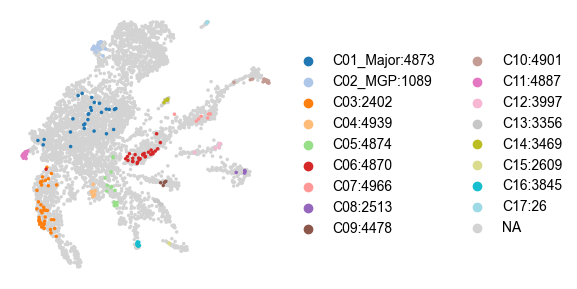

In [1359]:
mdata_Pla.obs['gex:spot_size'] = adata_Pla.obs['spot_size']
fig, ax = plt.subplots(1, 1, figsize=(3.5, 3.5))
mu.pl.embedding(mdata_Pla, 
                basis='gex:umap', 
                color="gex:anno-clone", 
                legend_fontweight=False,
                legend_fontoutline=False,
                legend_fontsize=10,
                outline_width=(0.15,0.02),
                groups=list(result['anno-clone']), 
                title='',
                ax=ax,
                show=False,
                palette='tab20')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("")
fig.savefig(f'{figPath}/4b-anno_Pla_anno:clonal.pdf', dpi=400, bbox_inches='tight')

<AxesSubplot: title={'center': 'Number of cells in airr:clone_id by gex:batch'}, xlabel='airr:clone_id', ylabel='Number of cells'>

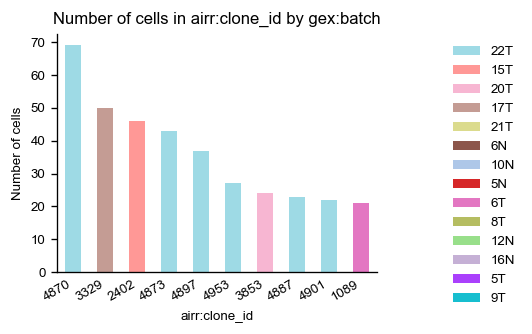

In [1264]:
ir.pl.group_abundance(mdata_Pla, groupby='airr:clone_id', target_col='gex:batch', max_cols=10)

In [1363]:
adata_Pla

AnnData object with n_obs × n_vars = 4656 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'IHC', 'tech', 'leiden-Pla', 'anno-Pla', 'clonal_size', 'spot_size', 'anno-clone'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'CellphoneDB', 'batch_colors', 'dendrogram_leiden', 'epi-subtype_colors', 'gender_colors', 'hvg', 'leiden', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_colors', 'log1p', 'majorType-Female_colors', 'majorType-fix_colors', 'major_type_colors', 'major_type_harmony_c

In [1364]:
adata_Pla.write_h5ad("adata-Pla-3.23.h5ad")

In [1366]:
conDict = {
  'others': ['TNBC', 'HR+HER2-', 'HR-HER2+','HR+HER2+'],
  'Normal': ['Non-tumoral',]
}
adata_no_knn, knn_adjacency, design_df = prepare_miloR(adata_Pla, conDict, 'TorN', 'IHC')

Index(['Normal', 'others'], dtype='object')


/tmp/ipykernel_1912653/3671355112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df.drop_duplicates(inplace=True)


In [1367]:
%%R -i adata_no_knn
library(ggplot2)
library(ggbeeswarm)
library(colorspace)
milo <- Milo(adata_no_knn)

/usr/lib/python3.10/functools.py:889: NotConvertedWarning: Conversion 'py2rpy' not defined for objects of type '<class 'NoneType'>'
  return dispatch(args[0].__class__)(*args, **kw)


In [1368]:
%%R -i knn_adjacency
milo_graph <- buildFromAdjacency(knn_adjacency, k=20, is.binary=TRUE)
graph(milo) <- miloR::graph(milo_graph)

milo <- buildGraph(milo, k=20, d=30)

## Define neighbourhoods
milo <- makeNhoods(milo, prop = 0.1, k = 20, d=30, refined = TRUE)
## Count cells in neighbourhoods
milo <- countCells(milo, meta.data = data.frame(colData(milo)), sample="batch")

## Calculate distances between cells in neighbourhoods
## for spatial FDR correction
milo <- calcNhoodDistance(milo, d=30)

Constructing kNN graph with k:20
Checking valid object
Running refined sampling with reduced_dim
Checking meta.data validity
Counting cells in neighbourhoods
In addition: Warning messages:
1: In (function (to_check, X, clust_centers, clust_info, dtype, nn,  :
  detected tied distances to neighbors, see ?'BiocNeighbors-ties'
2: In (function (to_check, X, clust_centers, clust_info, dtype, nn,  :
  detected tied distances to neighbors, see ?'BiocNeighbors-ties'
3: In (function (to_check, X, clust_centers, clust_info, dtype, nn,  :
  detected tied distances to neighbors, see ?'BiocNeighbors-ties'


In [1381]:
conDict = {
  'Normal': ['Non-tumoral', ],
  'Tumor': ['TNBC','HR+HER2+','HR+HER2-','HR-HER2+',]
}
adata_no_knn, knn_adjacency, design_df = prepare_miloR(adata_B, conDict, 'TorN', 'IHC')

Index(['Normal', 'Tumor'], dtype='object')


/tmp/ipykernel_1912653/3671355112.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  design_df.drop_duplicates(inplace=True)


In [1382]:
%%R -i design_df -o DA_results

## Test for differential abundance
DA_results <- testNhoods(milo, design = ~ TorN, design.df = design_df)

## Annotate differential abundance
milo <- buildNhoodGraph(milo)
DA_results <- annotateNhoods(milo, DA_results, coldata_col = "anno.Pla")

Using TMM normalisation
Performing spatial FDR correction withk-distance weighting
In addition: Warning messages:
1: In testNhoods(milo, design = ~TorN, design.df = design_df) :
  Sample names in design matrix and nhood counts are not matched. Reordering
2: In max(abs(logR)) : no non-missing arguments to max; returning -Inf


In [1383]:
%%R 
DA_results <- DA_results[order(DA_results[['anno.Pla']], decreasing=T), ]
p <- ggplot(DA_results, aes(x = logFC, y = anno.Pla)) +
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR > 0.1,], alpha=0.5, colour='grey50', size=1) + 
  geom_quasirandom(data=DA_results[DA_results$SpatialFDR <= 0.1,], aes(colour=logFC, alpha=abs(logFC)), size=1.5) + 
  geom_violin(color = "#44403f", alpha=0) +
  theme_bw() +
  scale_colour_gradient2(low=darken('blue'), mid='grey80', high=darken('#ff0000'), midpoint=0) +
  labs(x="Log Fold Change", y="Plasmablast subtypes") +
  theme(axis.text.y=element_text(size=12,colour='black'), axis.title.y=element_text(size=14),
        axis.text.x=element_text(size=12,colour='black'), axis.title.x=element_text(size=14),
        panel.grid.major = element_blank(), 
        panel.grid.minor = element_blank()) +
  stat_summary(aes(label = sprintf("%.2f",..x..)),
        fun = mean, geom = "text") +
  guides(colour=FALSE, alpha=FALSE)
ggsave("~/figure-1.23/DA_Pla_Tumor.pdf", p, width = 4, height = 3.5, units = "in")

Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`
Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`


In addition: Warning messages:
1: Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes. 
2: Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes. 
